In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist
import numpy as np
import os 

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
root_folder = 'Conv_VAE_log_results'
fixed_folder = root_folder + '/Fixed_results'
AE_folder = root_folder + '/AE_results'

if os.path.isdir(root_folder):
    !rm -r $root_folder
os.mkdir(root_folder)
os.mkdir(fixed_folder)
os.mkdir(AE_folder)

In [4]:
mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
           ])

In [5]:
def one_hot(y, batch_size):
    oh = torch.zeros([batch_size, 10])
    for st,idx in enumerate(y):          
        oh[st][idx] = 1 
    return oh       

In [6]:
train_loader, valid_loader, test_loader = mnist(valid=10000, transform=mnist_tanh)
fixed_z = torch.randn((50, 10))
fixed_data, fixed_cl = next(iter(test_loader))
fixed_oh = one_hot(y=fixed_cl, batch_size=50)
fixed_h = torch.cat((fixed_z, fixed_oh), 1) 

In [7]:
class ConvLayer(nn.Module):
    def __init__(self, size, padding=1, pool_layer=nn.MaxPool2d(2, stride=2),
                 bn=False, dropout=False, activation_fn=nn.ReLU(), stride=1):
        super(ConvLayer, self).__init__()
        layers = []
        layers.append(nn.Conv2d(size[0], size[1], size[2], padding=padding, stride=stride))
        if pool_layer is not None:
            layers.append(pool_layer)
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [8]:
class DeconvLayer(nn.Module):
    def __init__(self, size, padding=1, stride=1, 
                 bn=False, dropout=False, activation_fn=nn.ReLU(), output_padding=0):
        super(DeconvLayer, self).__init__()
        layers = []
        layers.append(nn.ConvTranspose2d(size[0], size[1], size[2], padding=padding, 
                                         stride=stride, output_padding=output_padding))
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [9]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh):
        super(FullyConnected, self).__init__()
        layers = []
        
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout())
            layers.append(activation_fn())
        else: # нам не нужен дропаут и фнкция активации в последнем слое
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.model(x)

In [10]:
class Net(nn.Module):
    def __init__(self, latent_size=32, gamma=1e-3, class_size=10, batchnorm=False, dropout=False, optim_type='SGD', **optim_params):
        super(Net, self).__init__()
    
        self.latent_size = latent_size
        self.class_size = class_size
        self.gamma = gamma
        
        self._conv1 = ConvLayer([1, 16, 4], padding=0, bn=batchnorm, stride=2, pool_layer=None)
        self._conv2 = ConvLayer([16, 32, 4], padding=0, bn=batchnorm, stride=2, pool_layer=None)
        self._conv3 = ConvLayer([32, 32, 3], padding=0, bn=batchnorm, stride=2, pool_layer=None)
            
        self.fce = FullyConnected([32*2*2, latent_size*2])
        
        self.fcd = FullyConnected([latent_size + class_size, 32*2*2])
        
        self._deconv1 = DeconvLayer([32, 32, 3], stride=2, padding=0, bn=batchnorm)
        self._deconv2 = DeconvLayer([32, 16, 4], stride=2, padding=0, bn=batchnorm, output_padding=1)
        self._deconv3 = DeconvLayer([16, 1, 4], stride=2, padding=0, bn=batchnorm, activation_fn=nn.Tanh())
        
        self._loss = None
        if optim_type == 'SGD':
            self.optim = optim.SGD(self.parameters(), **optim_params)
        elif optim_type == 'Adadelta':
            self.optim = optim.Adadelta(self.parameters(), **optim_params)
        elif optim_type == 'RMSProp':
            self.optim = optim.RMSprop(self.parameters(), **optim_params)
        elif optim_type == 'Adam':
            self.optim = optim.Adam(self.parameters(), **optim_params)
        
    def conv(self, x):
        l1 = self._conv1(x)
        l2 = self._conv2(l1)
        l3 = self._conv3(l2)
        return l3, l2, l1
    
    def encode(self, x):
        l3 = self.conv(x)[0]
        flatten = l3.view(-1, 32*2*2)
        h = self.fce(flatten)
        self.mu, self.logvar = h.split(self.latent_size, dim=1)
        return self.mu, self.logvar
    
    def decode(self, h):       
        flatten = self.fcd(h)
        l1 = flatten.view(-1, 32, 2, 2)
        l2 = self._deconv1(l1)
        l3 = self._deconv2(l2)
        x = self._deconv3(l3)
        return x
   
    def forward(self, x, y):
        mu, logvar = self.encode(x)
        if self.training:
            std = logvar.mul(0.5).exp()
            h = self._sample(mu.shape[0]) * std + mu
        else:
            h = mu
        oh = one_hot(y, batch_size=h.shape[0])           
        h = torch.cat((h, oh), 1)       
        x = self.decode(h)
        return x
    
    def _sample(self, n):
        return torch.randn([n, self.latent_size])
    
    def loss(self, output, target, size_average=True):
        KLD = self.mu**2 + self.logvar.exp() - 1 - self.logvar
        KLD = 0.5*KLD.sum(1)
        if size_average:
            self.KLD = KLD.mean()
        else:
            self.KLD = KLD.sum()
        self._loss = F.mse_loss(output, target, size_average=size_average)
        
        return self._loss + self.gamma*self.KLD

In [11]:
models = {
    'VAE10': Net(10, 0.005, batchnorm=False, dropout=False, optim_type='Adam', lr=1e-4),
    'VAE10+bn': Net(10, 0.005, batchnorm=True, dropout=False, optim_type='Adam', lr=1e-4),
    'VAE10+bn+dp': Net(10, 0.005, batchnorm=True, dropout=True, optim_type='Adam', lr=1e-4),
}
train_log = {k: [] for k in models}
test_log = {k: [] for k in models}

In [12]:
def train(epoch, models, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, cl) in enumerate(train_loader):
        for model in models.values():
            model.optim.zero_grad()
            output = model(data, cl)
            loss = model.loss(output, data)
            loss.backward()
            model.optim.step()
            
        if batch_idx % 200 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = ' '.join(['{}: {:.4f}'.format(k, m._loss.item()) for k, m in models.items()])
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = ' '.join(['{}: {:.4f}'.format(k, m._loss.item()) for k, m in models.items()])
        if log is not None:
            for k in models:
                log[k].append((models[k]._loss,))
        print(line + losses)

In [13]:
def test(models, loader, epoch, log=None):
    test_size = len(loader)
    test_reconstruction_loss = {k: 0. for k in models}
    test_KL_loss = {k: 0. for k in models}
    with torch.no_grad():
        for data, cl in loader:
            output = {k: m(data, cl) for k, m in models.items()}
            for k, m in models.items():
                m.loss(output[k], data)
                test_reconstruction_loss[k] += m._loss.item()
                test_KL_loss[k] += m.KLD.item()
    
    for k in models:
        test_reconstruction_loss[k] /= test_size
        test_KL_loss[k] /= test_size
    report = 'Test losses: ' + ' '.join(['{}: {:.4f}/{:.4f}'.format(k, 
                                                                    test_reconstruction_loss[k], 
                                                                    test_KL_loss[k]) for k in models])
    for k in models:
        if log is not None:
            log[k].append((test_reconstruction_loss[k], test_KL_loss[k]))
        with torch.no_grad():
            ae_data = models[k](fixed_data, fixed_cl).data.numpy()            
            fixed_gen = models[k].decode(fixed_h).data.numpy()
            plot_mnist(ae_data, (5, 10), True, AE_folder + '/%s_%03d.png' % (k, epoch))
            plot_mnist(fixed_gen, (5, 10), True, fixed_folder + '/%s_%03d.png' % (k, epoch))
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses VAE10: 0.9912 VAE10+bn: 0.9532 VAE10+bn+dp: 0.9542
Train Epoch: 1 [10000/50000 (20%)]	Losses VAE10: 0.5510 VAE10+bn: 0.8292 VAE10+bn+dp: 0.8246
Train Epoch: 1 [20000/50000 (40%)]	Losses VAE10: 0.4784 VAE10+bn: 0.7717 VAE10+bn+dp: 0.7671
Train Epoch: 1 [30000/50000 (60%)]	Losses VAE10: 0.4360 VAE10+bn: 0.7230 VAE10+bn+dp: 0.7186
Train Epoch: 1 [40000/50000 (80%)]	Losses VAE10: 0.3593 VAE10+bn: 0.6981 VAE10+bn+dp: 0.6966
Train Epoch: 1 [50000/50000 (100%)]	Losses VAE10: 0.3512 VAE10+bn: 0.6464 VAE10+bn+dp: 0.6425


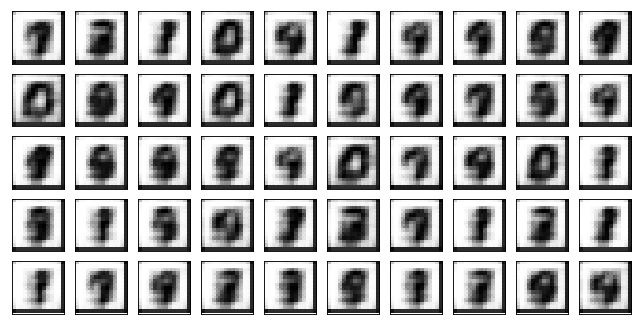

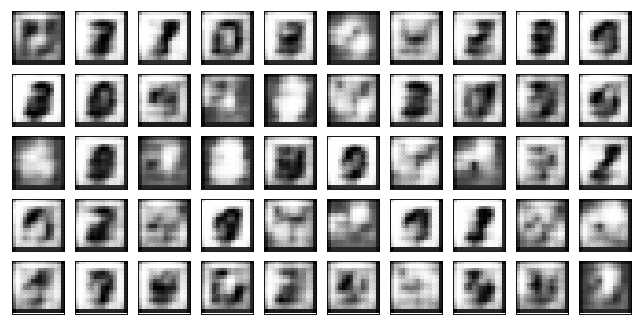

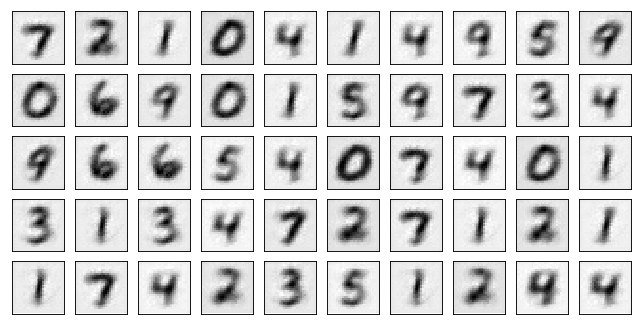

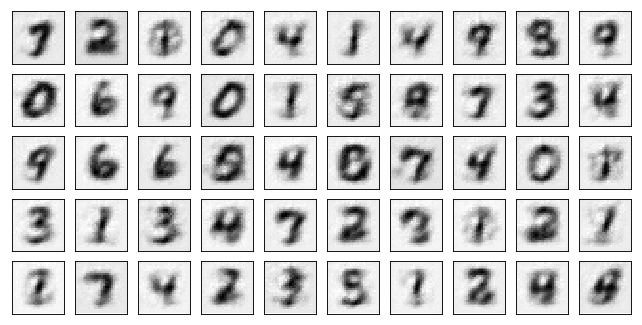

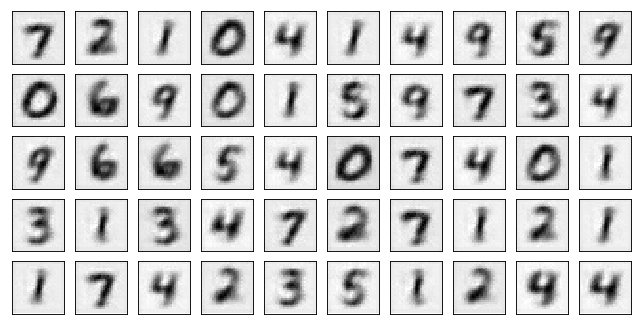

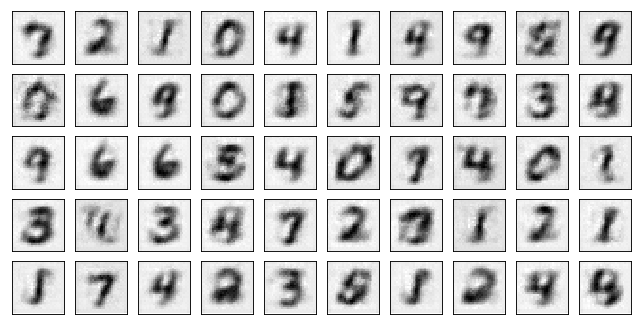

Test losses: VAE10: 0.3319/3.6266 VAE10+bn: 0.6211/1.4001 VAE10+bn+dp: 0.6190/1.6247
Train Epoch: 2 [0/50000 (0%)]	Losses VAE10: 0.3372 VAE10+bn: 0.6514 VAE10+bn+dp: 0.6537
Train Epoch: 2 [10000/50000 (20%)]	Losses VAE10: 0.3208 VAE10+bn: 0.6130 VAE10+bn+dp: 0.6102
Train Epoch: 2 [20000/50000 (40%)]	Losses VAE10: 0.2882 VAE10+bn: 0.5935 VAE10+bn+dp: 0.5883
Train Epoch: 2 [30000/50000 (60%)]	Losses VAE10: 0.2665 VAE10+bn: 0.5598 VAE10+bn+dp: 0.5528
Train Epoch: 2 [40000/50000 (80%)]	Losses VAE10: 0.2452 VAE10+bn: 0.5208 VAE10+bn+dp: 0.5177
Train Epoch: 2 [50000/50000 (100%)]	Losses VAE10: 0.2467 VAE10+bn: 0.4992 VAE10+bn+dp: 0.4956


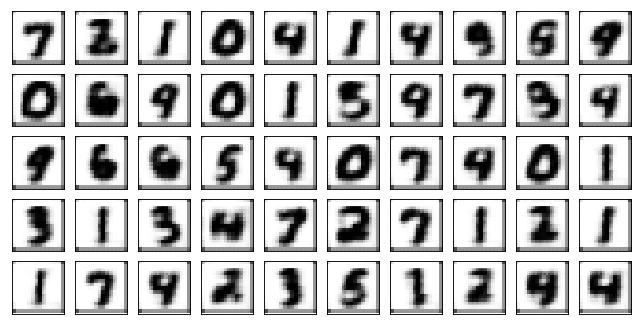

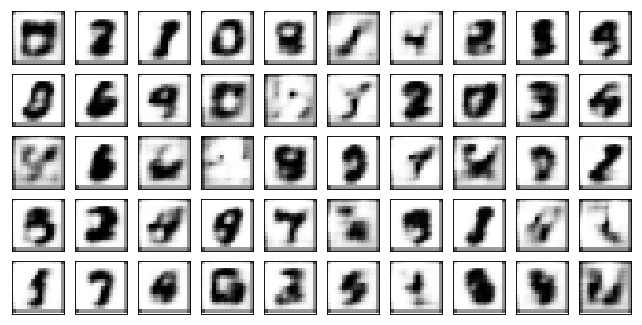

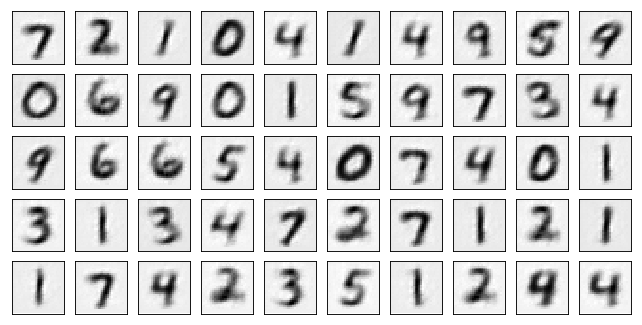

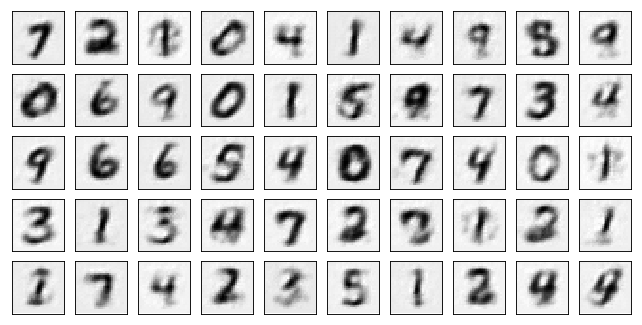

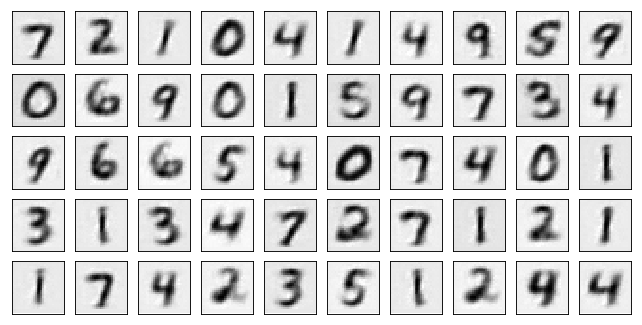

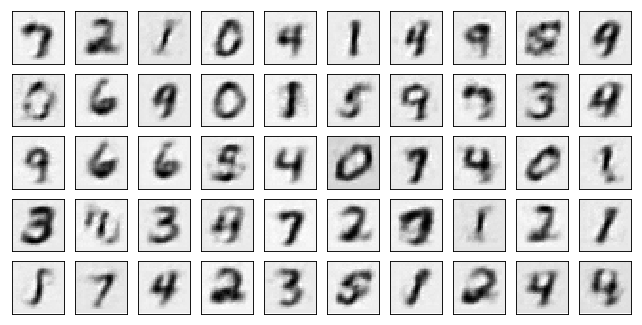

Test losses: VAE10: 0.2180/4.3228 VAE10+bn: 0.4821/2.9061 VAE10+bn+dp: 0.4789/3.1737
Train Epoch: 3 [0/50000 (0%)]	Losses VAE10: 0.2570 VAE10+bn: 0.4942 VAE10+bn+dp: 0.4902
Train Epoch: 3 [10000/50000 (20%)]	Losses VAE10: 0.2213 VAE10+bn: 0.4741 VAE10+bn+dp: 0.4676
Train Epoch: 3 [20000/50000 (40%)]	Losses VAE10: 0.2146 VAE10+bn: 0.4441 VAE10+bn+dp: 0.4439
Train Epoch: 3 [30000/50000 (60%)]	Losses VAE10: 0.1927 VAE10+bn: 0.4402 VAE10+bn+dp: 0.4356
Train Epoch: 3 [40000/50000 (80%)]	Losses VAE10: 0.1971 VAE10+bn: 0.4169 VAE10+bn+dp: 0.4121
Train Epoch: 3 [50000/50000 (100%)]	Losses VAE10: 0.2039 VAE10+bn: 0.3915 VAE10+bn+dp: 0.3820


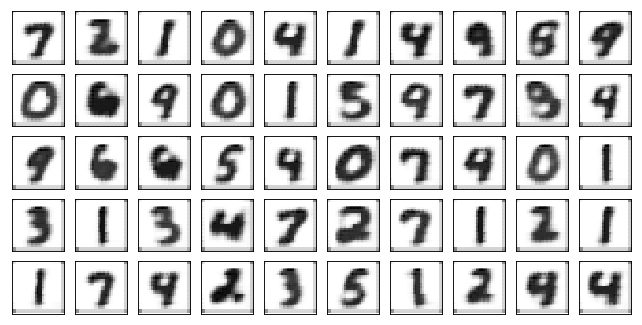

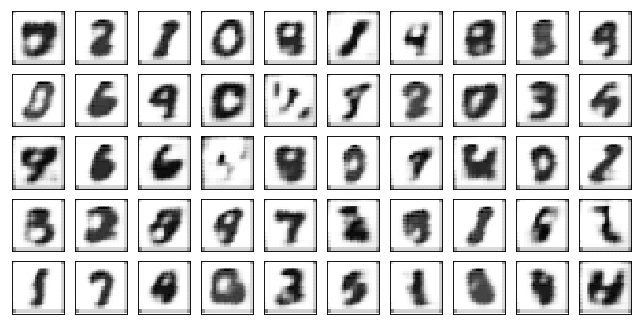

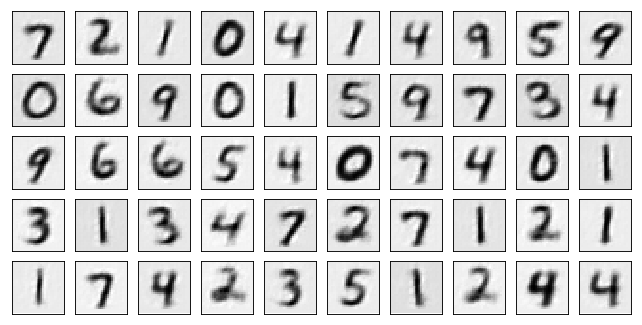

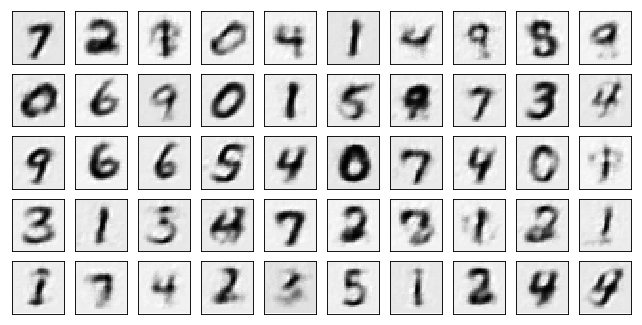

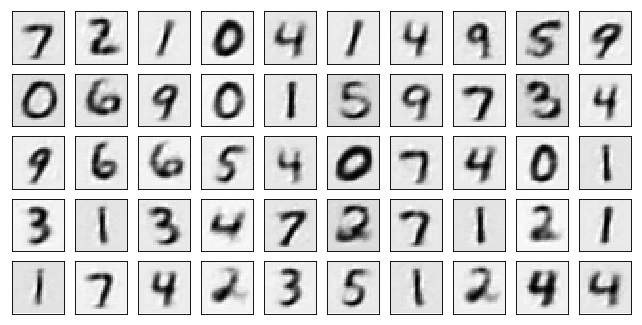

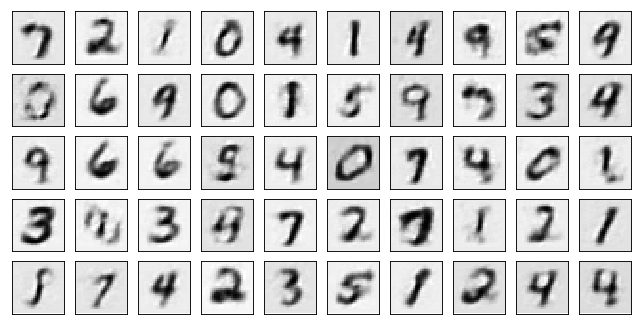

Test losses: VAE10: 0.1830/4.6068 VAE10+bn: 0.3749/4.2075 VAE10+bn+dp: 0.3741/4.3413
Train Epoch: 4 [0/50000 (0%)]	Losses VAE10: 0.1905 VAE10+bn: 0.3931 VAE10+bn+dp: 0.3905
Train Epoch: 4 [10000/50000 (20%)]	Losses VAE10: 0.1888 VAE10+bn: 0.3705 VAE10+bn+dp: 0.3701
Train Epoch: 4 [20000/50000 (40%)]	Losses VAE10: 0.1785 VAE10+bn: 0.3571 VAE10+bn+dp: 0.3570
Train Epoch: 4 [30000/50000 (60%)]	Losses VAE10: 0.1792 VAE10+bn: 0.3338 VAE10+bn+dp: 0.3323
Train Epoch: 4 [40000/50000 (80%)]	Losses VAE10: 0.1640 VAE10+bn: 0.3212 VAE10+bn+dp: 0.3224
Train Epoch: 4 [50000/50000 (100%)]	Losses VAE10: 0.1471 VAE10+bn: 0.3158 VAE10+bn+dp: 0.3138


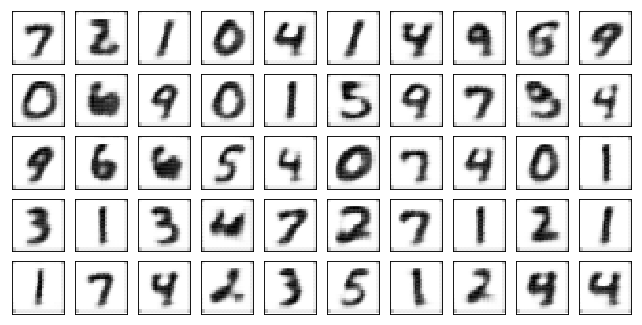

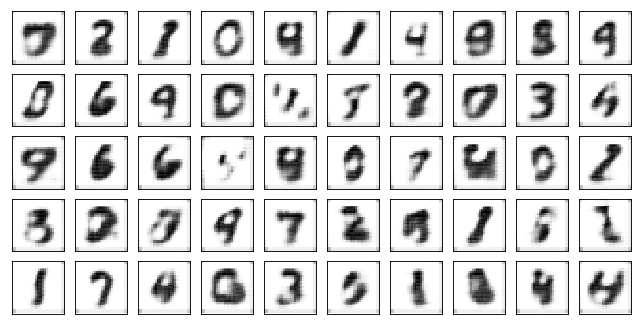

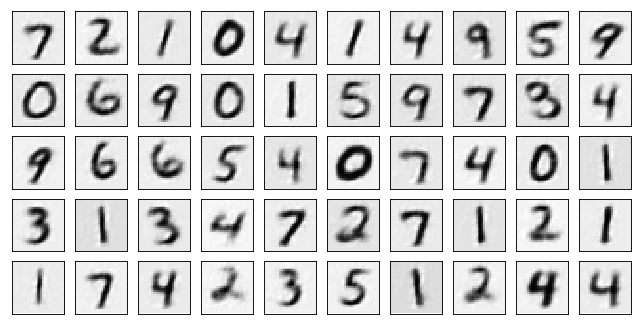

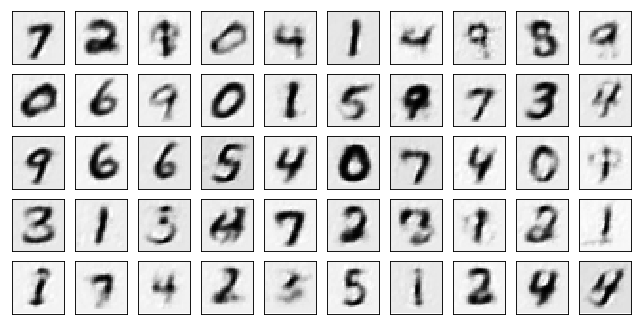

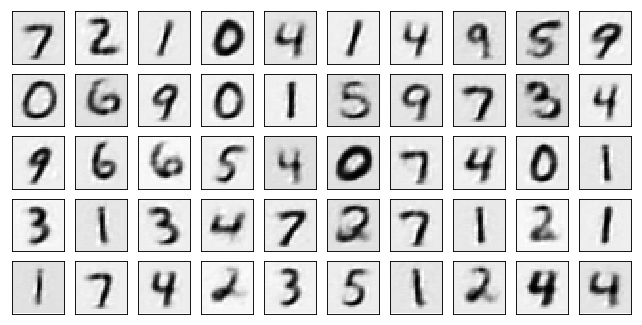

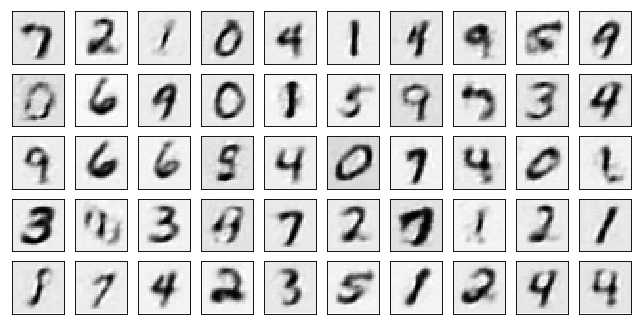

Test losses: VAE10: 0.1366/6.2977 VAE10+bn: 0.2976/5.2338 VAE10+bn+dp: 0.2944/5.1751
Train Epoch: 5 [0/50000 (0%)]	Losses VAE10: 0.1431 VAE10+bn: 0.3113 VAE10+bn+dp: 0.3084
Train Epoch: 5 [10000/50000 (20%)]	Losses VAE10: 0.1403 VAE10+bn: 0.2937 VAE10+bn+dp: 0.2876
Train Epoch: 5 [20000/50000 (40%)]	Losses VAE10: 0.1598 VAE10+bn: 0.3071 VAE10+bn+dp: 0.3026
Train Epoch: 5 [30000/50000 (60%)]	Losses VAE10: 0.1370 VAE10+bn: 0.2766 VAE10+bn+dp: 0.2756
Train Epoch: 5 [40000/50000 (80%)]	Losses VAE10: 0.1310 VAE10+bn: 0.2561 VAE10+bn+dp: 0.2604
Train Epoch: 5 [50000/50000 (100%)]	Losses VAE10: 0.1433 VAE10+bn: 0.2624 VAE10+bn+dp: 0.2608


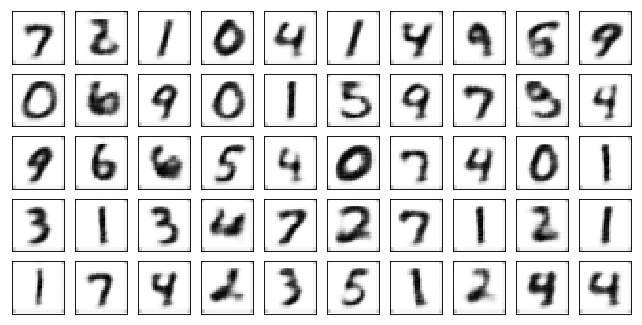

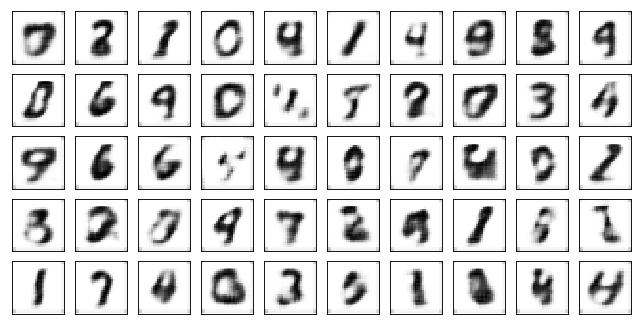

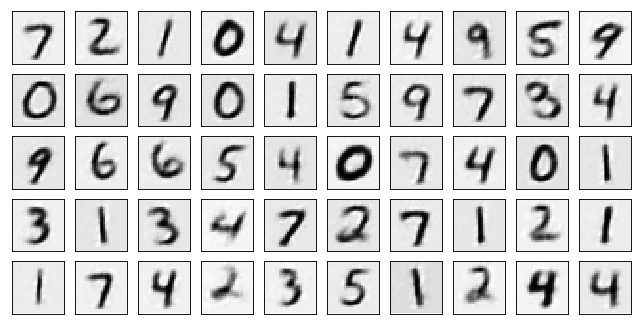

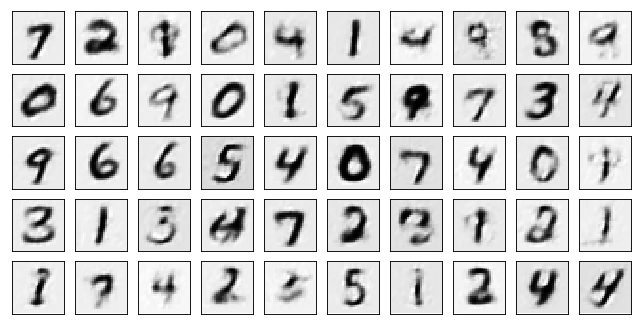

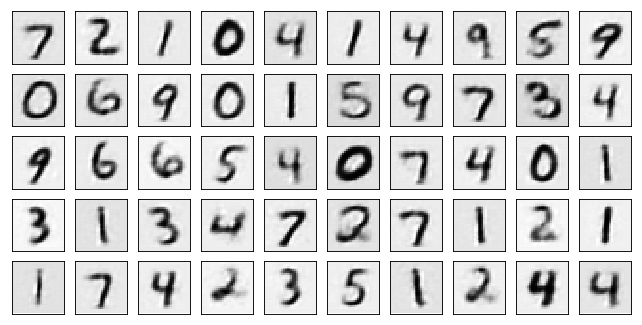

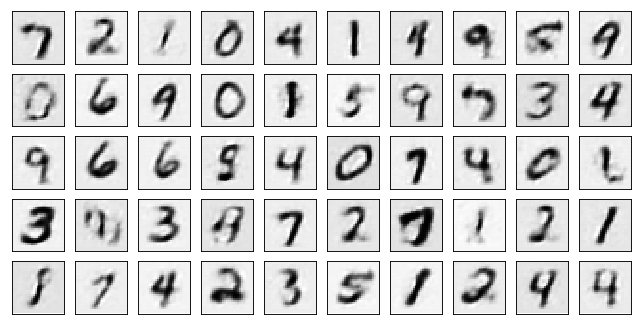

Test losses: VAE10: 0.1198/7.0985 VAE10+bn: 0.2388/5.8731 VAE10+bn+dp: 0.2391/5.7442
Train Epoch: 6 [0/50000 (0%)]	Losses VAE10: 0.1473 VAE10+bn: 0.2627 VAE10+bn+dp: 0.2619
Train Epoch: 6 [10000/50000 (20%)]	Losses VAE10: 0.1385 VAE10+bn: 0.2483 VAE10+bn+dp: 0.2470
Train Epoch: 6 [20000/50000 (40%)]	Losses VAE10: 0.1341 VAE10+bn: 0.2383 VAE10+bn+dp: 0.2402
Train Epoch: 6 [30000/50000 (60%)]	Losses VAE10: 0.1456 VAE10+bn: 0.2363 VAE10+bn+dp: 0.2415
Train Epoch: 6 [40000/50000 (80%)]	Losses VAE10: 0.1235 VAE10+bn: 0.2207 VAE10+bn+dp: 0.2212
Train Epoch: 6 [50000/50000 (100%)]	Losses VAE10: 0.1269 VAE10+bn: 0.2238 VAE10+bn+dp: 0.2220


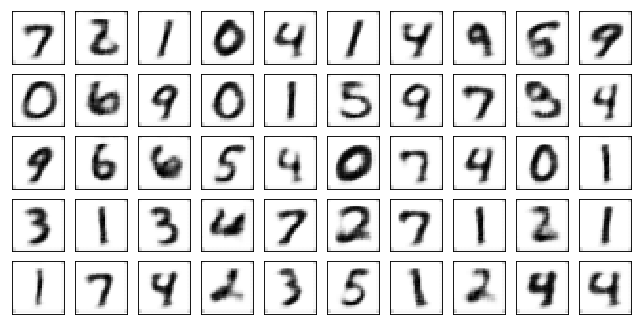

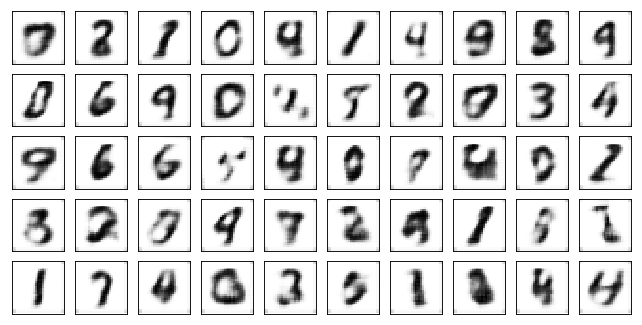

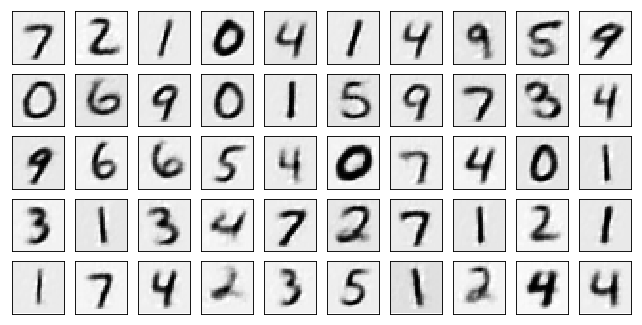

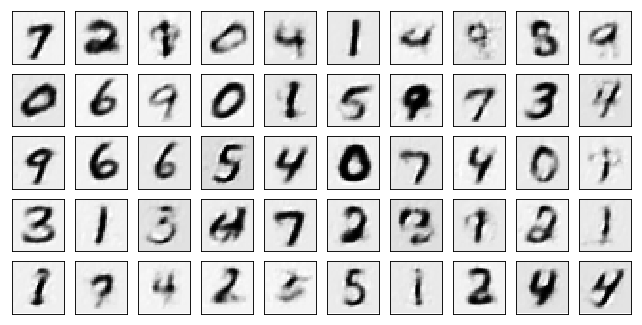

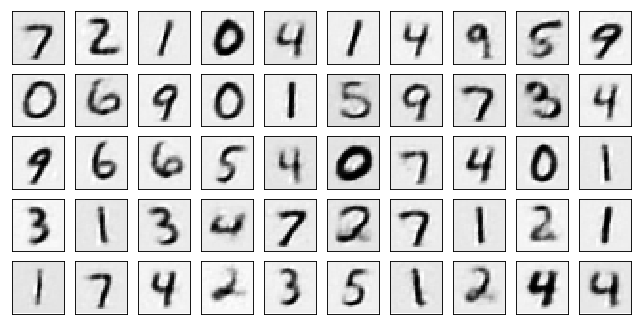

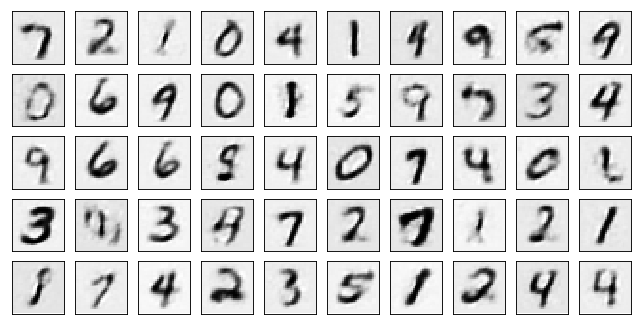

Test losses: VAE10: 0.1111/7.6282 VAE10+bn: 0.1992/6.4926 VAE10+bn+dp: 0.1980/6.1990
Train Epoch: 7 [0/50000 (0%)]	Losses VAE10: 0.1400 VAE10+bn: 0.2266 VAE10+bn+dp: 0.2288
Train Epoch: 7 [10000/50000 (20%)]	Losses VAE10: 0.1208 VAE10+bn: 0.2104 VAE10+bn+dp: 0.2064
Train Epoch: 7 [20000/50000 (40%)]	Losses VAE10: 0.1388 VAE10+bn: 0.2154 VAE10+bn+dp: 0.2098
Train Epoch: 7 [30000/50000 (60%)]	Losses VAE10: 0.1163 VAE10+bn: 0.1856 VAE10+bn+dp: 0.1878
Train Epoch: 7 [40000/50000 (80%)]	Losses VAE10: 0.1090 VAE10+bn: 0.1760 VAE10+bn+dp: 0.1775
Train Epoch: 7 [50000/50000 (100%)]	Losses VAE10: 0.1334 VAE10+bn: 0.1976 VAE10+bn+dp: 0.2012


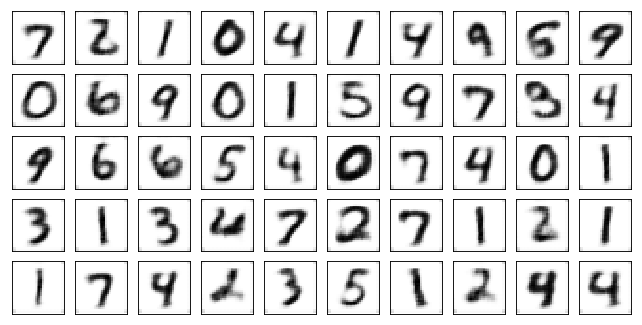

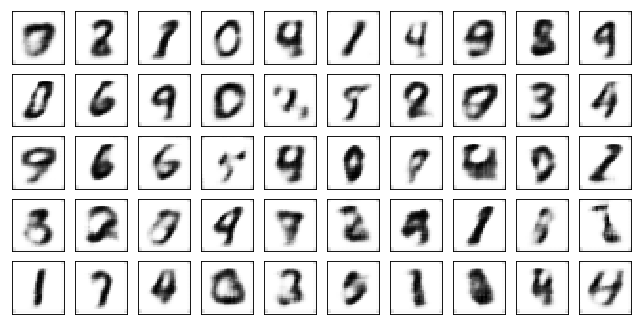

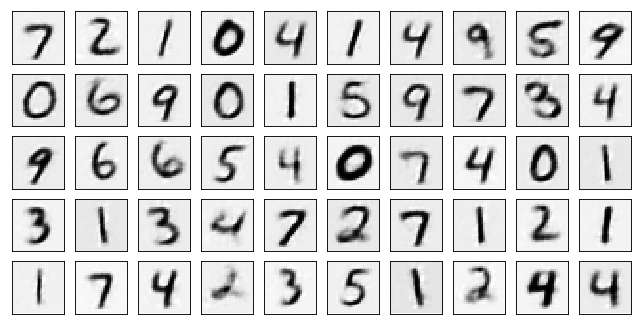

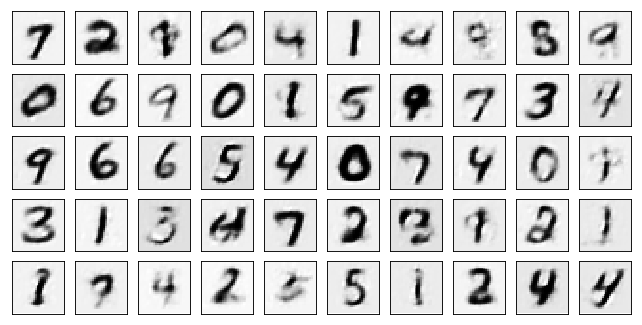

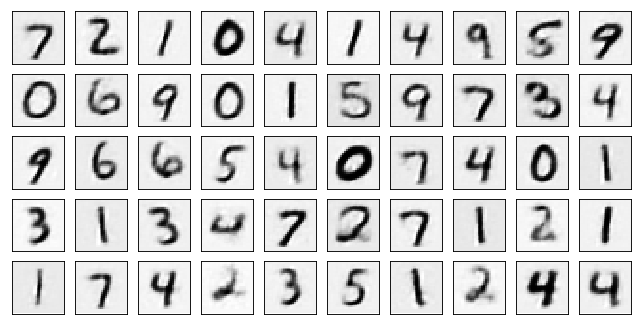

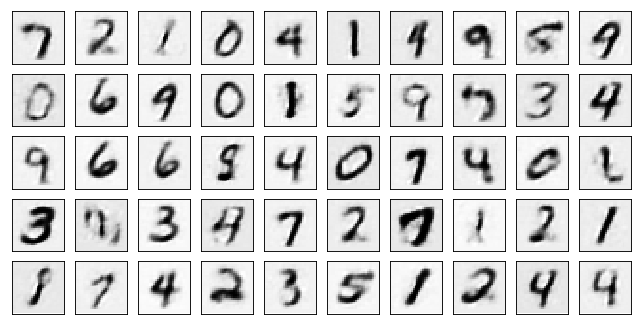

Test losses: VAE10: 0.1051/7.6619 VAE10+bn: 0.1675/6.8001 VAE10+bn+dp: 0.1690/6.4441
Train Epoch: 8 [0/50000 (0%)]	Losses VAE10: 0.1339 VAE10+bn: 0.1949 VAE10+bn+dp: 0.1993
Train Epoch: 8 [10000/50000 (20%)]	Losses VAE10: 0.1198 VAE10+bn: 0.1918 VAE10+bn+dp: 0.1946
Train Epoch: 8 [20000/50000 (40%)]	Losses VAE10: 0.1276 VAE10+bn: 0.1795 VAE10+bn+dp: 0.1771
Train Epoch: 8 [30000/50000 (60%)]	Losses VAE10: 0.1346 VAE10+bn: 0.1799 VAE10+bn+dp: 0.1822
Train Epoch: 8 [40000/50000 (80%)]	Losses VAE10: 0.1173 VAE10+bn: 0.1581 VAE10+bn+dp: 0.1625
Train Epoch: 8 [50000/50000 (100%)]	Losses VAE10: 0.1157 VAE10+bn: 0.1579 VAE10+bn+dp: 0.1582


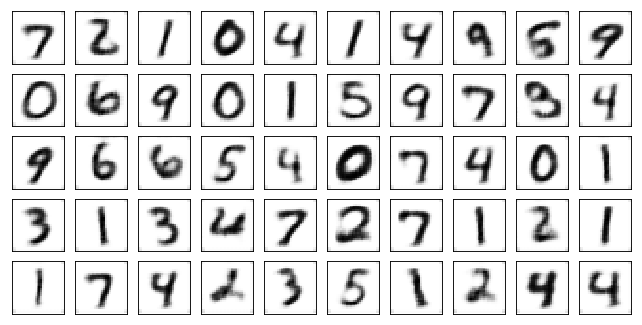

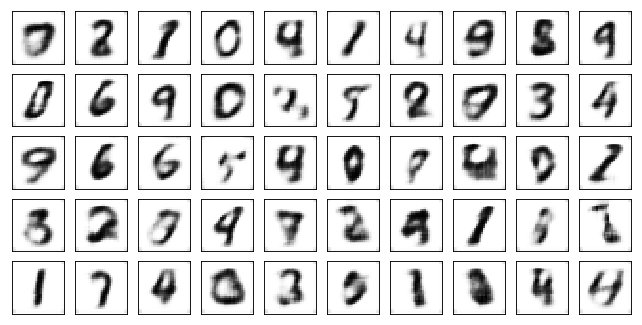

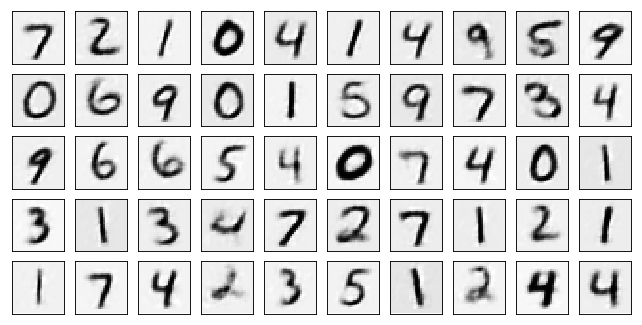

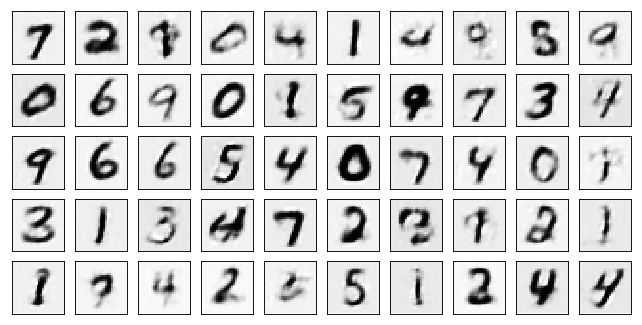

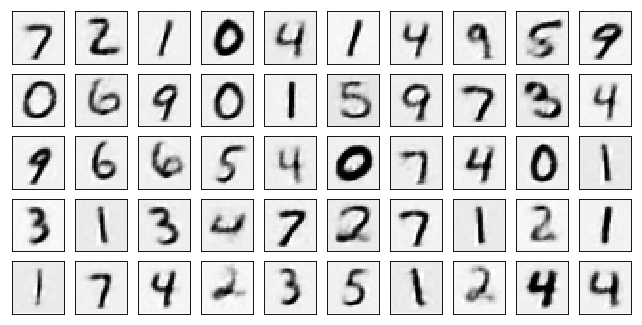

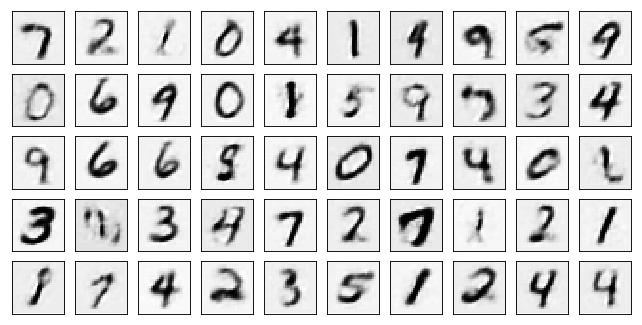

Test losses: VAE10: 0.1003/7.9438 VAE10+bn: 0.1423/7.2172 VAE10+bn+dp: 0.1448/6.8411
Train Epoch: 9 [0/50000 (0%)]	Losses VAE10: 0.1186 VAE10+bn: 0.1654 VAE10+bn+dp: 0.1631
Train Epoch: 9 [10000/50000 (20%)]	Losses VAE10: 0.1131 VAE10+bn: 0.1564 VAE10+bn+dp: 0.1557
Train Epoch: 9 [20000/50000 (40%)]	Losses VAE10: 0.1054 VAE10+bn: 0.1518 VAE10+bn+dp: 0.1503
Train Epoch: 9 [30000/50000 (60%)]	Losses VAE10: 0.1209 VAE10+bn: 0.1577 VAE10+bn+dp: 0.1606
Train Epoch: 9 [40000/50000 (80%)]	Losses VAE10: 0.1142 VAE10+bn: 0.1522 VAE10+bn+dp: 0.1554
Train Epoch: 9 [50000/50000 (100%)]	Losses VAE10: 0.1069 VAE10+bn: 0.1463 VAE10+bn+dp: 0.1476


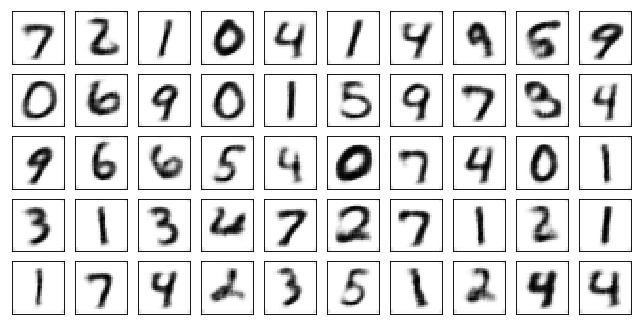

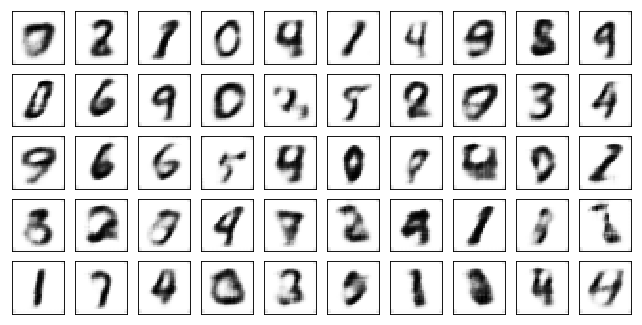

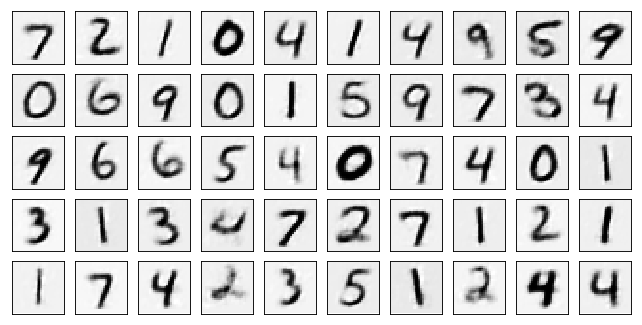

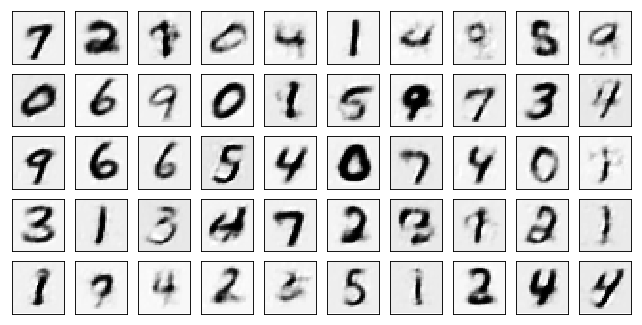

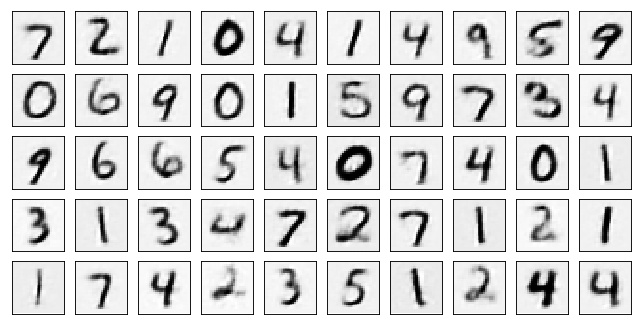

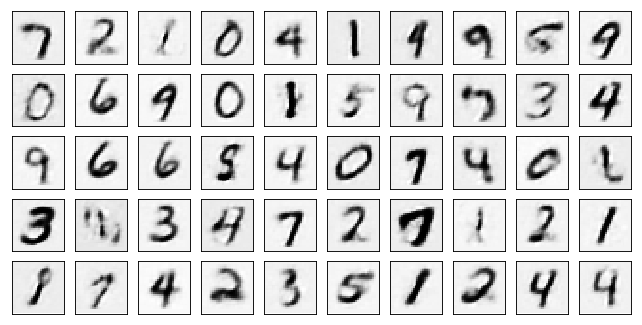

Test losses: VAE10: 0.0971/8.0692 VAE10+bn: 0.1277/7.4994 VAE10+bn+dp: 0.1298/7.0751
Train Epoch: 10 [0/50000 (0%)]	Losses VAE10: 0.1252 VAE10+bn: 0.1547 VAE10+bn+dp: 0.1609
Train Epoch: 10 [10000/50000 (20%)]	Losses VAE10: 0.1082 VAE10+bn: 0.1374 VAE10+bn+dp: 0.1450
Train Epoch: 10 [20000/50000 (40%)]	Losses VAE10: 0.1061 VAE10+bn: 0.1316 VAE10+bn+dp: 0.1270
Train Epoch: 10 [30000/50000 (60%)]	Losses VAE10: 0.1158 VAE10+bn: 0.1362 VAE10+bn+dp: 0.1365
Train Epoch: 10 [40000/50000 (80%)]	Losses VAE10: 0.1211 VAE10+bn: 0.1434 VAE10+bn+dp: 0.1474
Train Epoch: 10 [50000/50000 (100%)]	Losses VAE10: 0.1102 VAE10+bn: 0.1322 VAE10+bn+dp: 0.1405


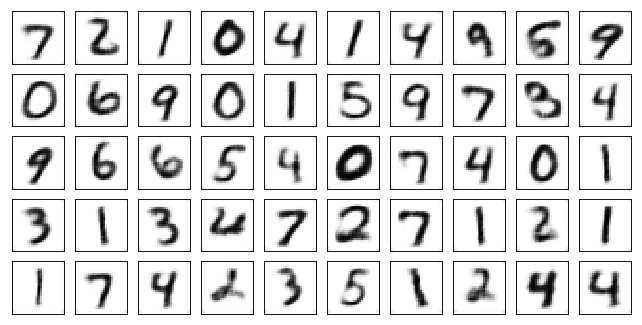

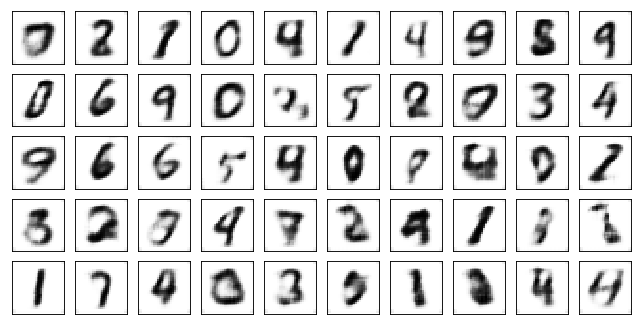

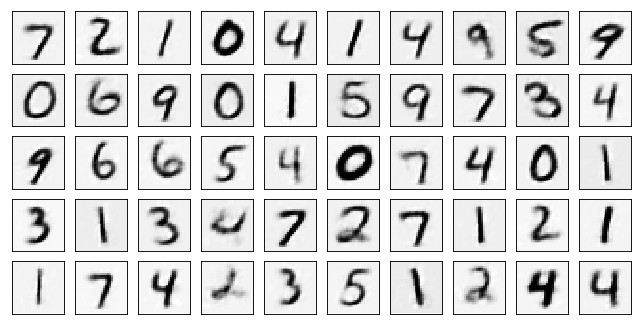

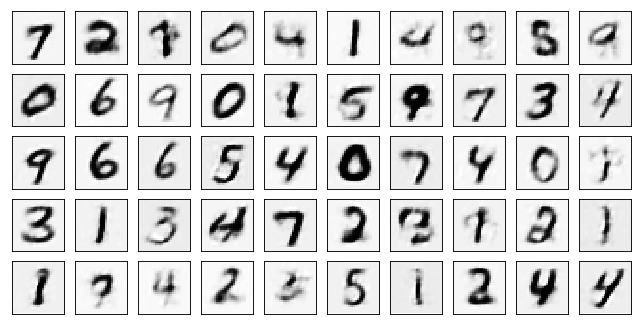

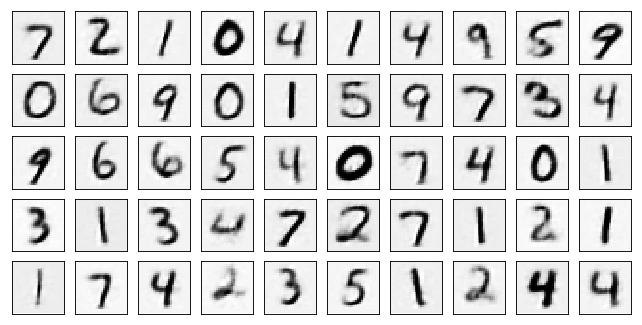

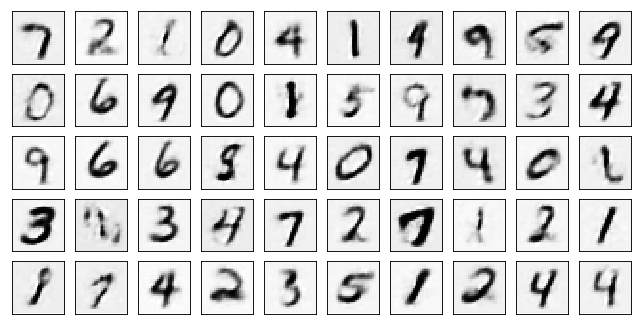

Test losses: VAE10: 0.0941/8.1064 VAE10+bn: 0.1146/7.6955 VAE10+bn+dp: 0.1178/7.1761
Train Epoch: 11 [0/50000 (0%)]	Losses VAE10: 0.1142 VAE10+bn: 0.1401 VAE10+bn+dp: 0.1381
Train Epoch: 11 [10000/50000 (20%)]	Losses VAE10: 0.1072 VAE10+bn: 0.1215 VAE10+bn+dp: 0.1302
Train Epoch: 11 [20000/50000 (40%)]	Losses VAE10: 0.0982 VAE10+bn: 0.1203 VAE10+bn+dp: 0.1216
Train Epoch: 11 [30000/50000 (60%)]	Losses VAE10: 0.1044 VAE10+bn: 0.1189 VAE10+bn+dp: 0.1199
Train Epoch: 11 [40000/50000 (80%)]	Losses VAE10: 0.1152 VAE10+bn: 0.1329 VAE10+bn+dp: 0.1392
Train Epoch: 11 [50000/50000 (100%)]	Losses VAE10: 0.1067 VAE10+bn: 0.1232 VAE10+bn+dp: 0.1270


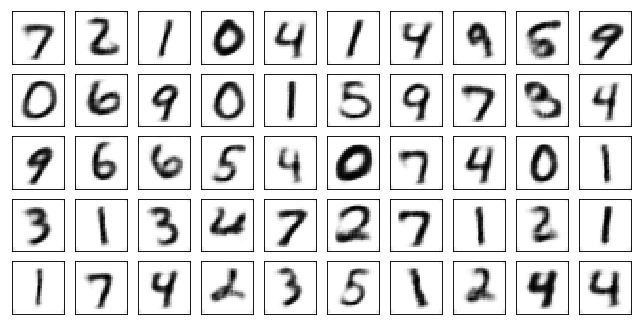

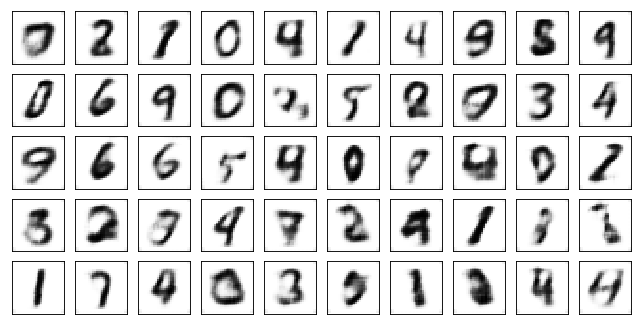

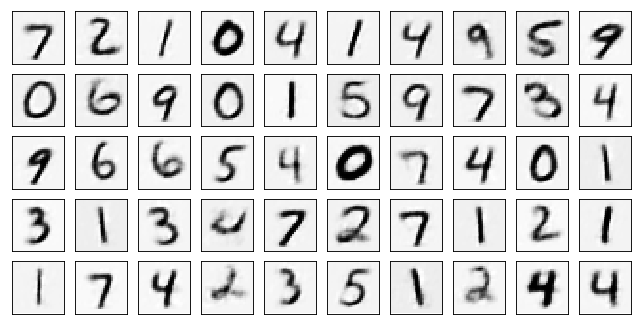

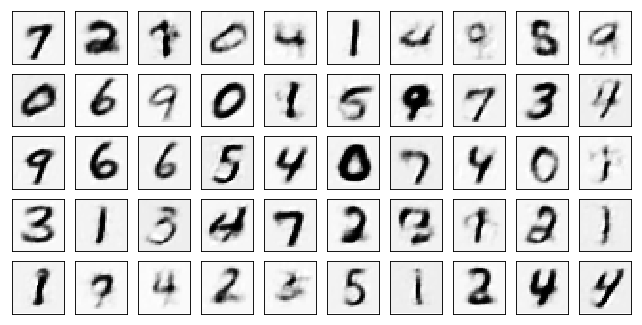

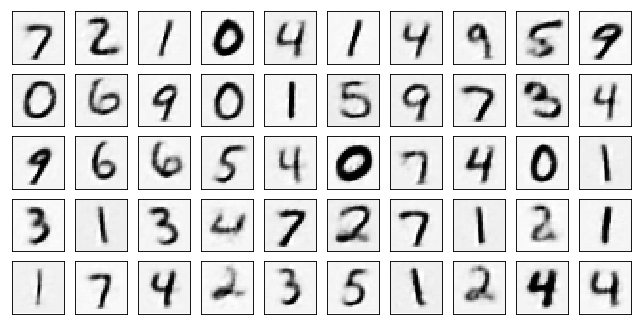

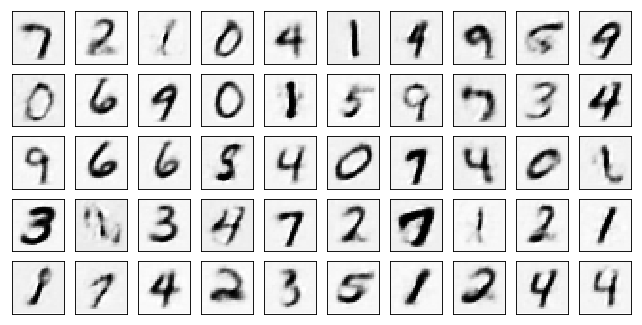

Test losses: VAE10: 0.0920/8.1203 VAE10+bn: 0.1053/7.8489 VAE10+bn+dp: 0.1092/7.4466
Train Epoch: 12 [0/50000 (0%)]	Losses VAE10: 0.1071 VAE10+bn: 0.1206 VAE10+bn+dp: 0.1251
Train Epoch: 12 [10000/50000 (20%)]	Losses VAE10: 0.1082 VAE10+bn: 0.1224 VAE10+bn+dp: 0.1280
Train Epoch: 12 [20000/50000 (40%)]	Losses VAE10: 0.1105 VAE10+bn: 0.1269 VAE10+bn+dp: 0.1273
Train Epoch: 12 [30000/50000 (60%)]	Losses VAE10: 0.1168 VAE10+bn: 0.1224 VAE10+bn+dp: 0.1237
Train Epoch: 12 [40000/50000 (80%)]	Losses VAE10: 0.1181 VAE10+bn: 0.1311 VAE10+bn+dp: 0.1318
Train Epoch: 12 [50000/50000 (100%)]	Losses VAE10: 0.1071 VAE10+bn: 0.1165 VAE10+bn+dp: 0.1190


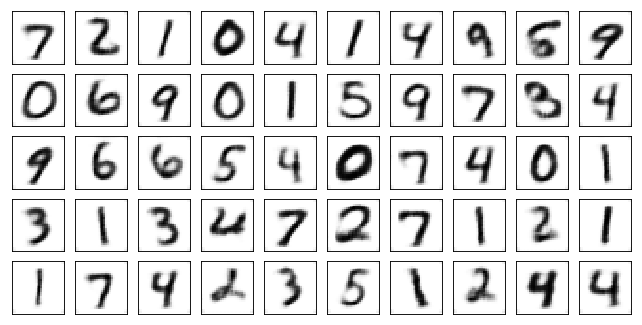

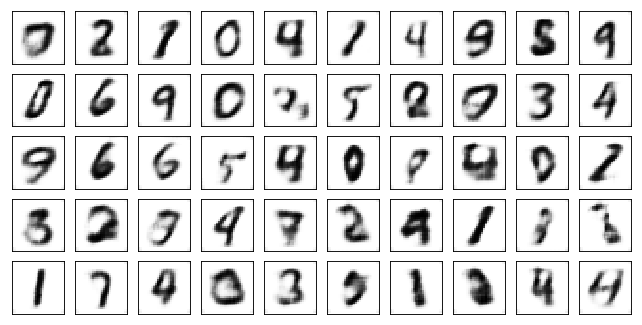

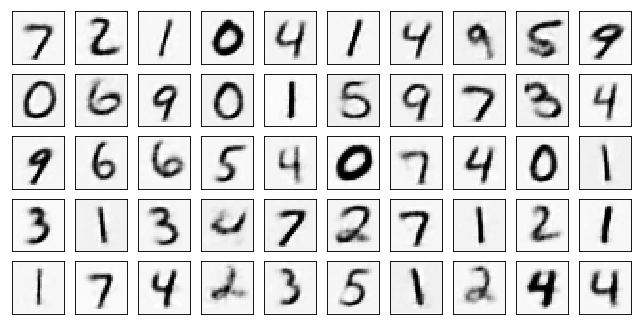

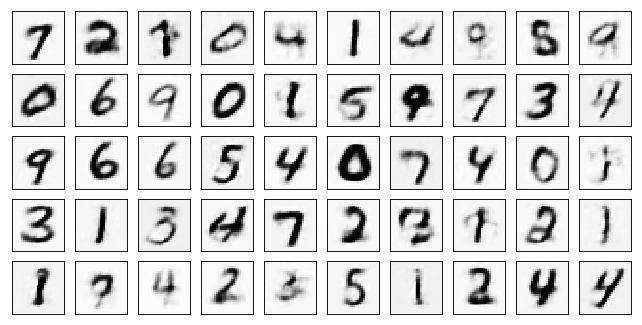

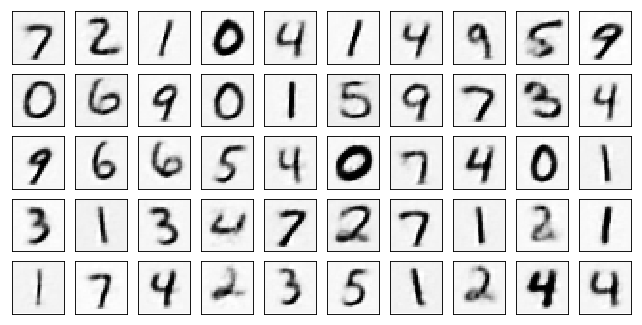

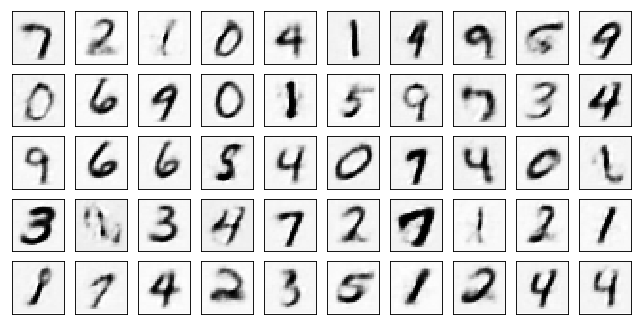

Test losses: VAE10: 0.0902/8.2185 VAE10+bn: 0.0984/7.9558 VAE10+bn+dp: 0.1020/7.4835
Train Epoch: 13 [0/50000 (0%)]	Losses VAE10: 0.0989 VAE10+bn: 0.1054 VAE10+bn+dp: 0.1103
Train Epoch: 13 [10000/50000 (20%)]	Losses VAE10: 0.1055 VAE10+bn: 0.1103 VAE10+bn+dp: 0.1112
Train Epoch: 13 [20000/50000 (40%)]	Losses VAE10: 0.1136 VAE10+bn: 0.1239 VAE10+bn+dp: 0.1253
Train Epoch: 13 [30000/50000 (60%)]	Losses VAE10: 0.1203 VAE10+bn: 0.1299 VAE10+bn+dp: 0.1316
Train Epoch: 13 [40000/50000 (80%)]	Losses VAE10: 0.1073 VAE10+bn: 0.1130 VAE10+bn+dp: 0.1175
Train Epoch: 13 [50000/50000 (100%)]	Losses VAE10: 0.1140 VAE10+bn: 0.1261 VAE10+bn+dp: 0.1313


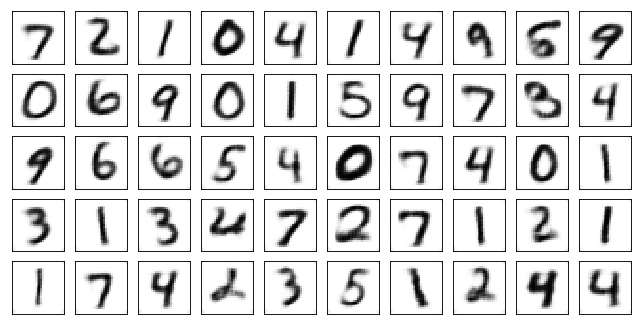

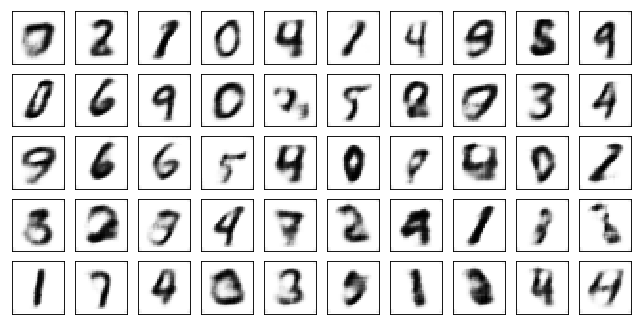

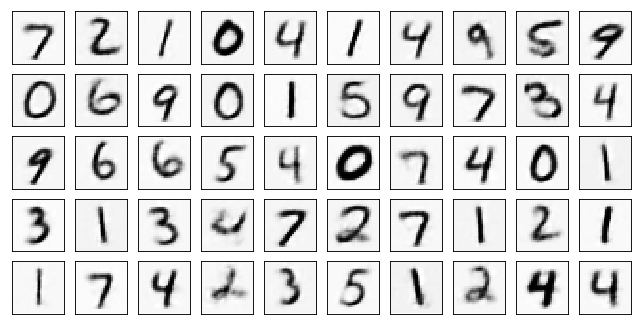

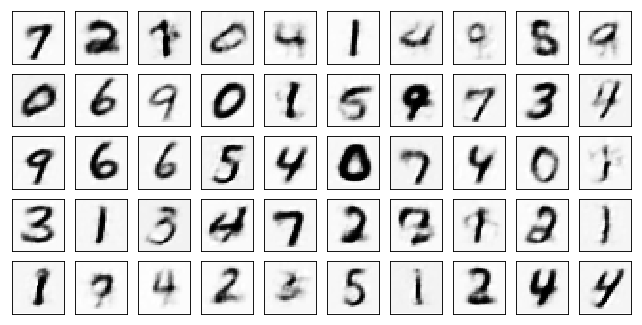

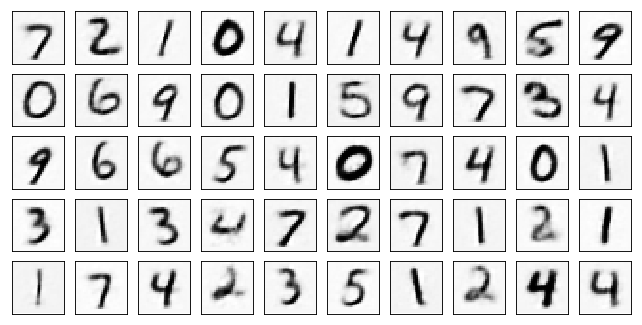

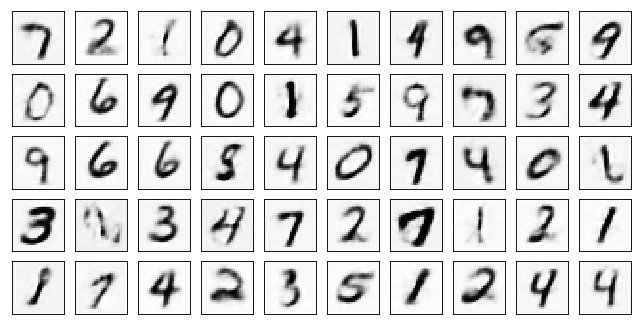

Test losses: VAE10: 0.0882/8.3727 VAE10+bn: 0.0937/7.9881 VAE10+bn+dp: 0.0972/7.5817
Train Epoch: 14 [0/50000 (0%)]	Losses VAE10: 0.1101 VAE10+bn: 0.1099 VAE10+bn+dp: 0.1131
Train Epoch: 14 [10000/50000 (20%)]	Losses VAE10: 0.1099 VAE10+bn: 0.1230 VAE10+bn+dp: 0.1225
Train Epoch: 14 [20000/50000 (40%)]	Losses VAE10: 0.1191 VAE10+bn: 0.1274 VAE10+bn+dp: 0.1282
Train Epoch: 14 [30000/50000 (60%)]	Losses VAE10: 0.1053 VAE10+bn: 0.1129 VAE10+bn+dp: 0.1154
Train Epoch: 14 [40000/50000 (80%)]	Losses VAE10: 0.1035 VAE10+bn: 0.1070 VAE10+bn+dp: 0.1088
Train Epoch: 14 [50000/50000 (100%)]	Losses VAE10: 0.0972 VAE10+bn: 0.1048 VAE10+bn+dp: 0.1044


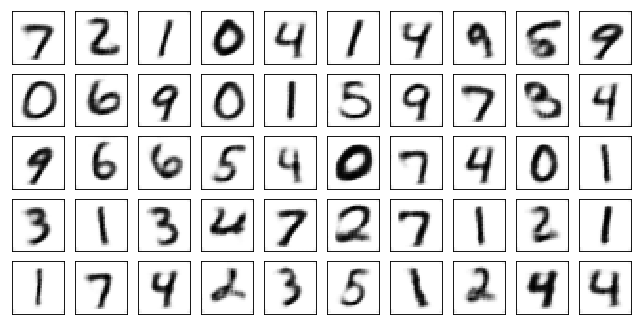

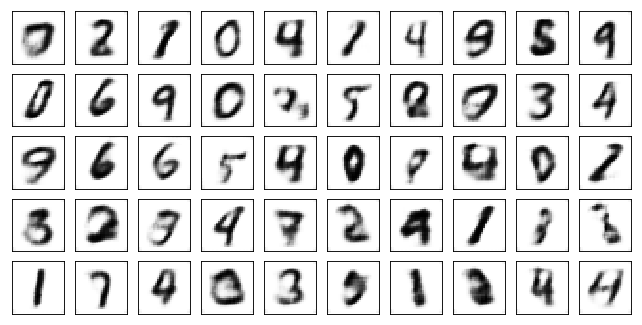

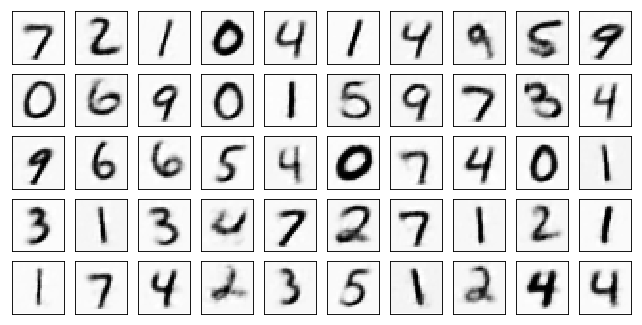

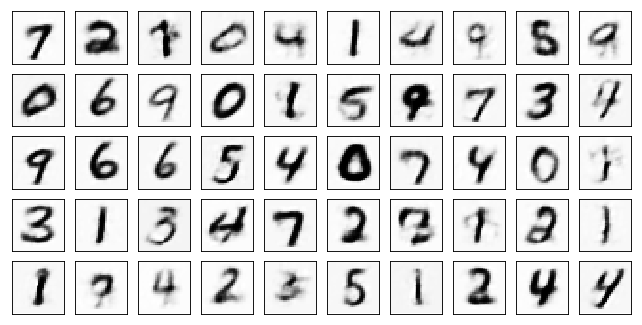

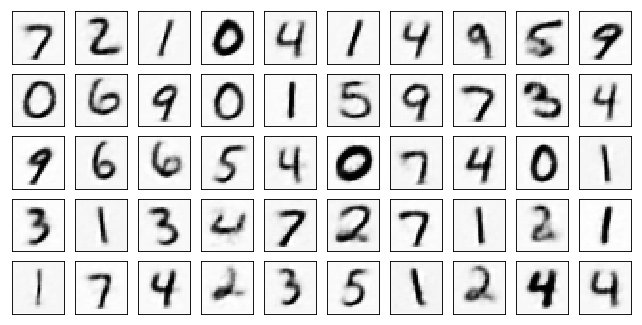

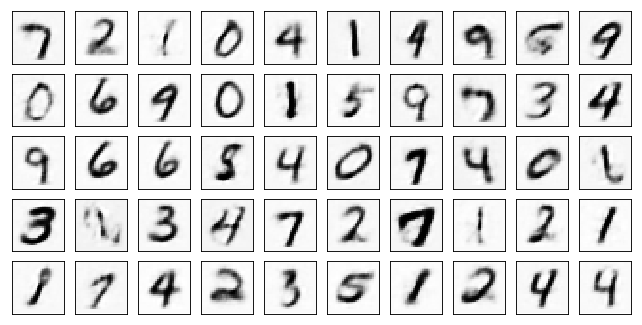

Test losses: VAE10: 0.0869/8.5177 VAE10+bn: 0.0902/8.1020 VAE10+bn+dp: 0.0936/7.5443
Train Epoch: 15 [0/50000 (0%)]	Losses VAE10: 0.1048 VAE10+bn: 0.1146 VAE10+bn+dp: 0.1156
Train Epoch: 15 [10000/50000 (20%)]	Losses VAE10: 0.1038 VAE10+bn: 0.1067 VAE10+bn+dp: 0.1059
Train Epoch: 15 [20000/50000 (40%)]	Losses VAE10: 0.1032 VAE10+bn: 0.1102 VAE10+bn+dp: 0.1108
Train Epoch: 15 [30000/50000 (60%)]	Losses VAE10: 0.1085 VAE10+bn: 0.1105 VAE10+bn+dp: 0.1085
Train Epoch: 15 [40000/50000 (80%)]	Losses VAE10: 0.1037 VAE10+bn: 0.1078 VAE10+bn+dp: 0.1081
Train Epoch: 15 [50000/50000 (100%)]	Losses VAE10: 0.0972 VAE10+bn: 0.1031 VAE10+bn+dp: 0.1034


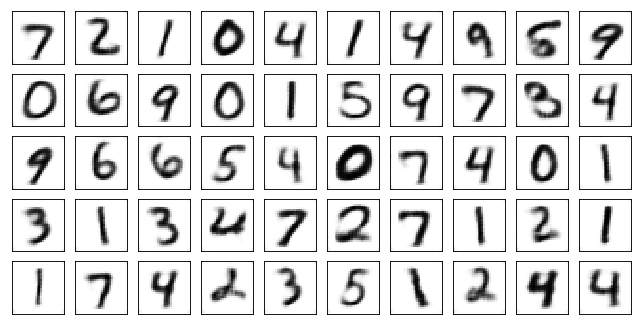

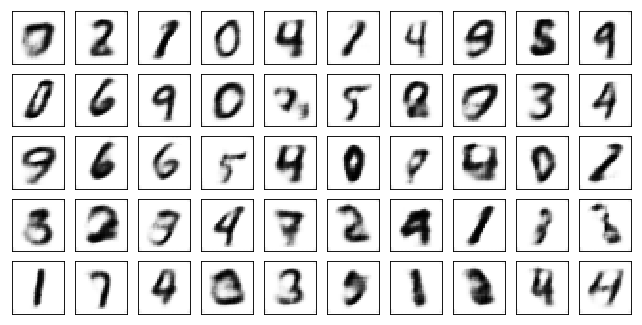

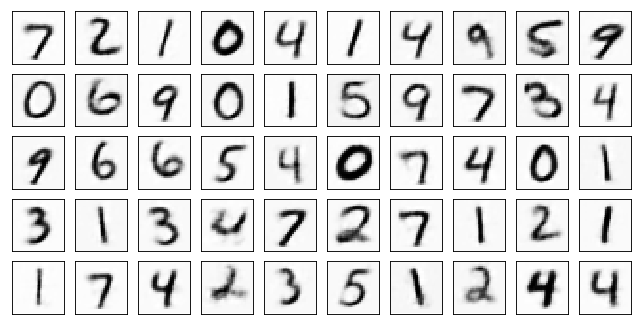

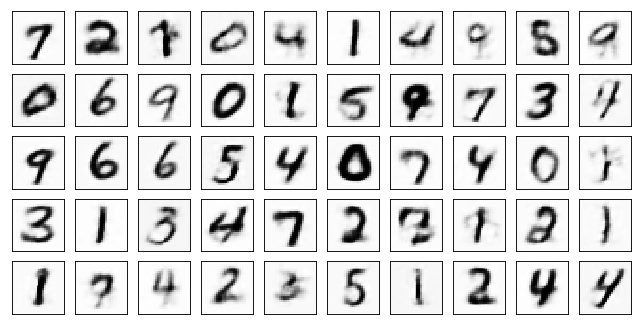

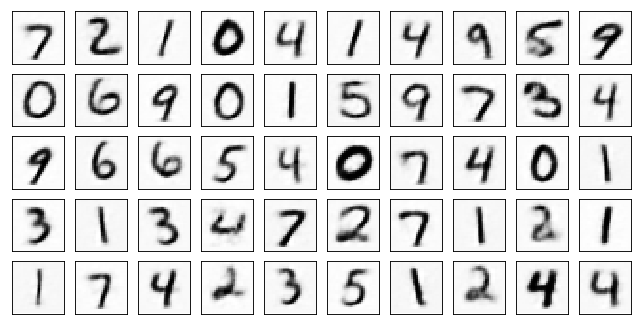

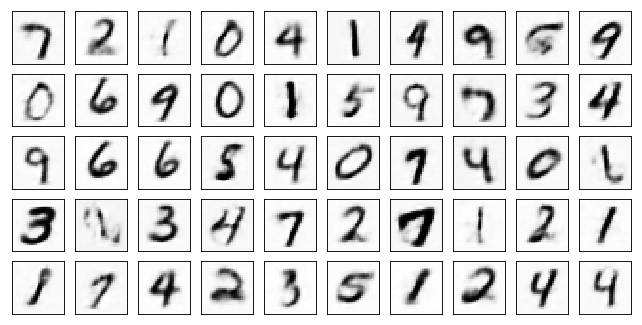

Test losses: VAE10: 0.0857/8.3876 VAE10+bn: 0.0874/7.9995 VAE10+bn+dp: 0.0907/7.5014
Train Epoch: 16 [0/50000 (0%)]	Losses VAE10: 0.1077 VAE10+bn: 0.1133 VAE10+bn+dp: 0.1175
Train Epoch: 16 [10000/50000 (20%)]	Losses VAE10: 0.1073 VAE10+bn: 0.1087 VAE10+bn+dp: 0.1131
Train Epoch: 16 [20000/50000 (40%)]	Losses VAE10: 0.1043 VAE10+bn: 0.1016 VAE10+bn+dp: 0.1070
Train Epoch: 16 [30000/50000 (60%)]	Losses VAE10: 0.1081 VAE10+bn: 0.1099 VAE10+bn+dp: 0.1138
Train Epoch: 16 [40000/50000 (80%)]	Losses VAE10: 0.1053 VAE10+bn: 0.1055 VAE10+bn+dp: 0.1068
Train Epoch: 16 [50000/50000 (100%)]	Losses VAE10: 0.1077 VAE10+bn: 0.1008 VAE10+bn+dp: 0.1099


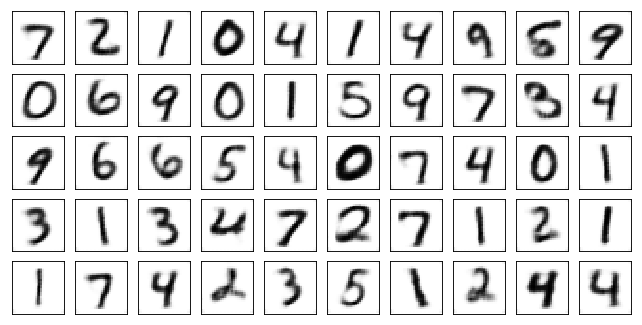

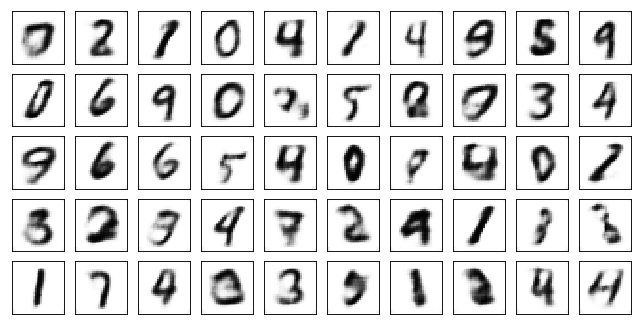

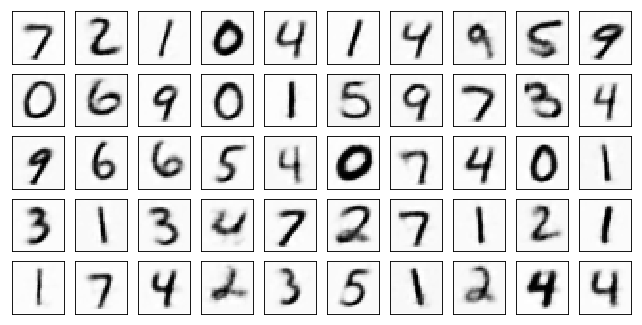

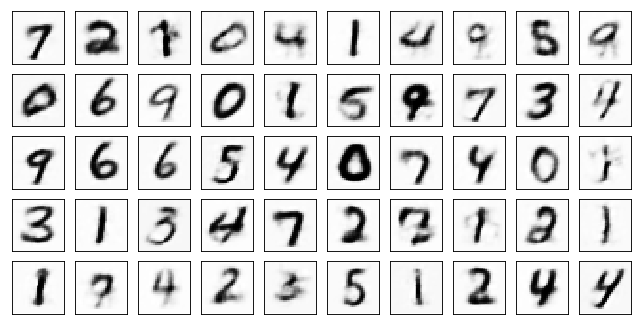

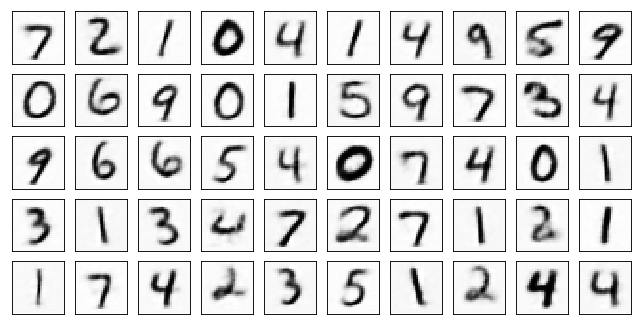

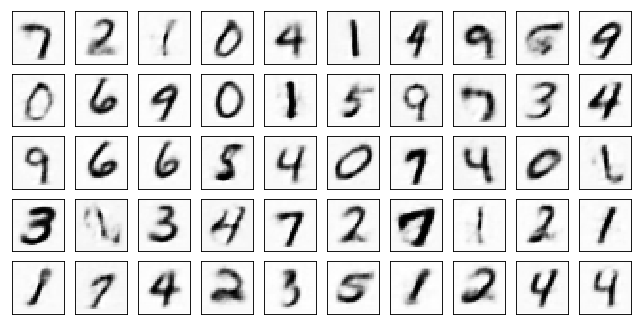

Test losses: VAE10: 0.0846/8.4272 VAE10+bn: 0.0850/8.1232 VAE10+bn+dp: 0.0879/7.5867
Train Epoch: 17 [0/50000 (0%)]	Losses VAE10: 0.1119 VAE10+bn: 0.1083 VAE10+bn+dp: 0.1078
Train Epoch: 17 [10000/50000 (20%)]	Losses VAE10: 0.0989 VAE10+bn: 0.0967 VAE10+bn+dp: 0.0980
Train Epoch: 17 [20000/50000 (40%)]	Losses VAE10: 0.1121 VAE10+bn: 0.1106 VAE10+bn+dp: 0.1092
Train Epoch: 17 [30000/50000 (60%)]	Losses VAE10: 0.1032 VAE10+bn: 0.1022 VAE10+bn+dp: 0.1035
Train Epoch: 17 [40000/50000 (80%)]	Losses VAE10: 0.1093 VAE10+bn: 0.1062 VAE10+bn+dp: 0.1085
Train Epoch: 17 [50000/50000 (100%)]	Losses VAE10: 0.1045 VAE10+bn: 0.1062 VAE10+bn+dp: 0.1044


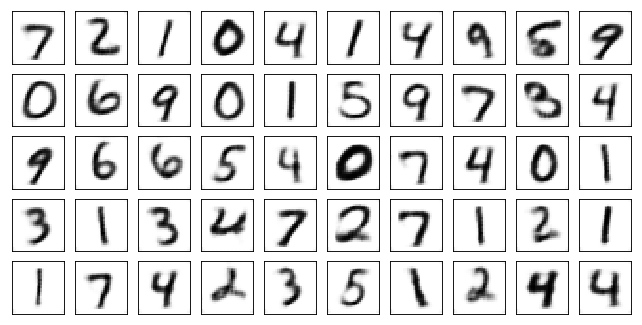

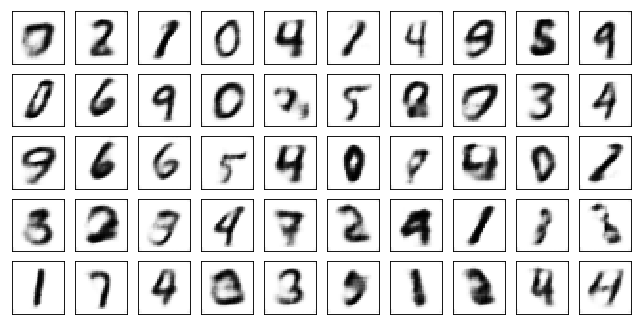

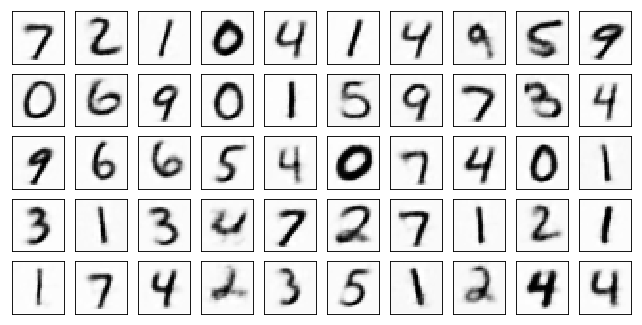

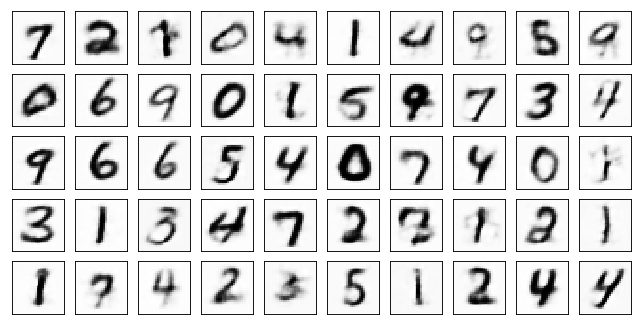

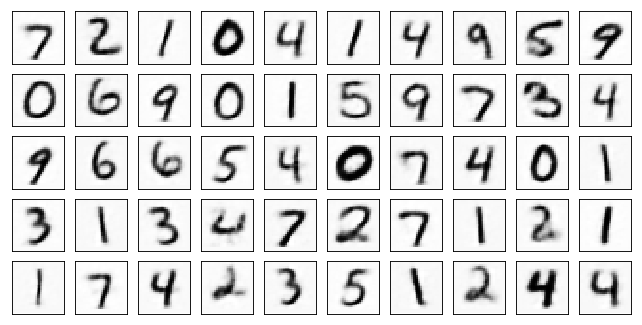

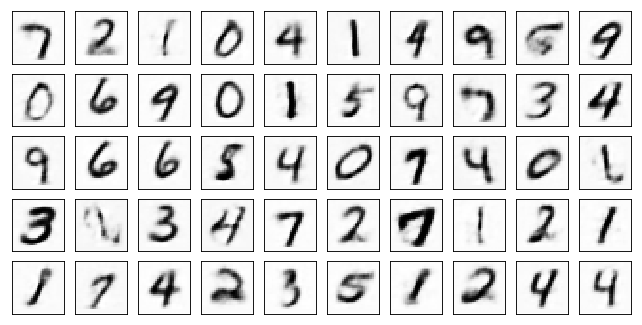

Test losses: VAE10: 0.0835/8.4947 VAE10+bn: 0.0830/8.2571 VAE10+bn+dp: 0.0861/7.6501
Train Epoch: 18 [0/50000 (0%)]	Losses VAE10: 0.1085 VAE10+bn: 0.1032 VAE10+bn+dp: 0.1075
Train Epoch: 18 [10000/50000 (20%)]	Losses VAE10: 0.1081 VAE10+bn: 0.1089 VAE10+bn+dp: 0.1068
Train Epoch: 18 [20000/50000 (40%)]	Losses VAE10: 0.1065 VAE10+bn: 0.1040 VAE10+bn+dp: 0.1064
Train Epoch: 18 [30000/50000 (60%)]	Losses VAE10: 0.1050 VAE10+bn: 0.1039 VAE10+bn+dp: 0.1078
Train Epoch: 18 [40000/50000 (80%)]	Losses VAE10: 0.1030 VAE10+bn: 0.0994 VAE10+bn+dp: 0.1045
Train Epoch: 18 [50000/50000 (100%)]	Losses VAE10: 0.0975 VAE10+bn: 0.0982 VAE10+bn+dp: 0.0987


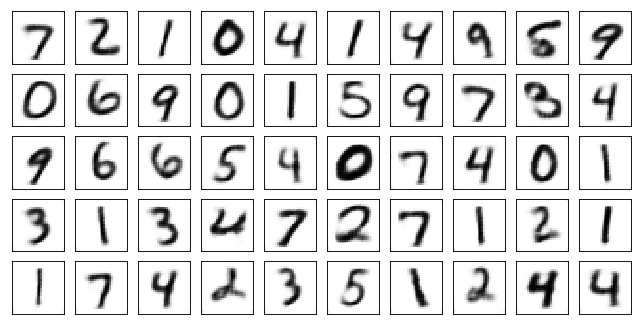

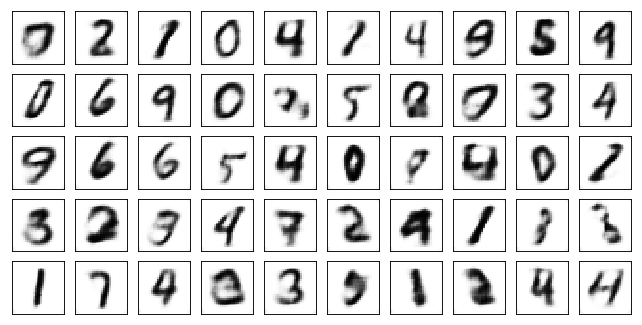

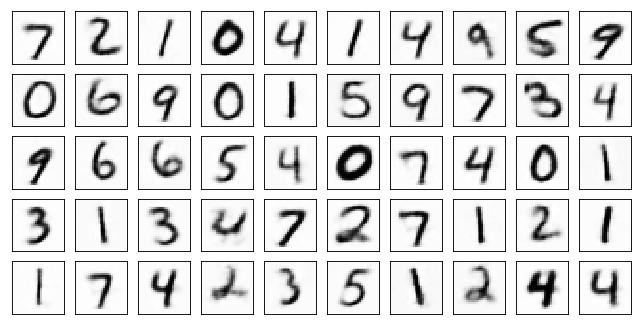

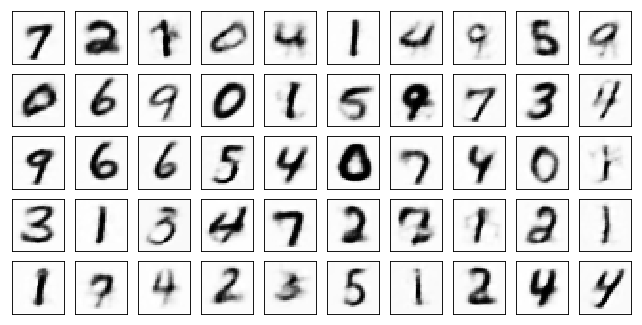

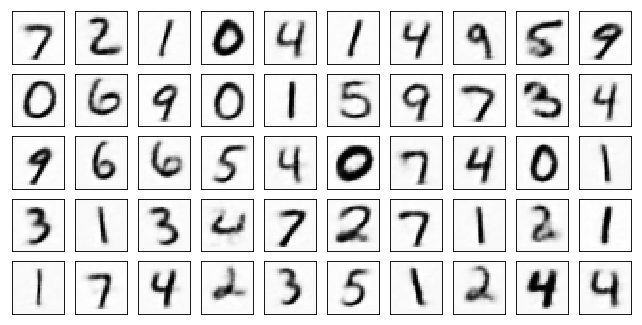

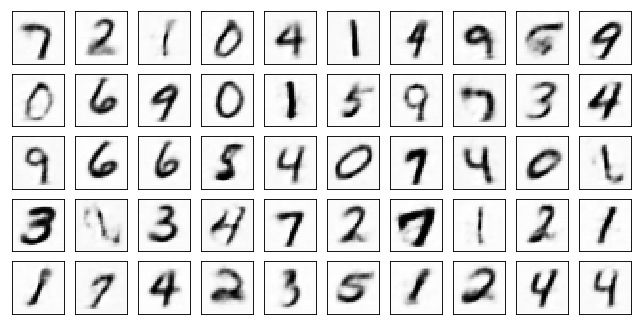

Test losses: VAE10: 0.0828/8.5095 VAE10+bn: 0.0819/8.1017 VAE10+bn+dp: 0.0846/7.7214
Train Epoch: 19 [0/50000 (0%)]	Losses VAE10: 0.1112 VAE10+bn: 0.1095 VAE10+bn+dp: 0.1098
Train Epoch: 19 [10000/50000 (20%)]	Losses VAE10: 0.1085 VAE10+bn: 0.1033 VAE10+bn+dp: 0.1073
Train Epoch: 19 [20000/50000 (40%)]	Losses VAE10: 0.1051 VAE10+bn: 0.1026 VAE10+bn+dp: 0.1107
Train Epoch: 19 [30000/50000 (60%)]	Losses VAE10: 0.0965 VAE10+bn: 0.0901 VAE10+bn+dp: 0.0921
Train Epoch: 19 [40000/50000 (80%)]	Losses VAE10: 0.0939 VAE10+bn: 0.0986 VAE10+bn+dp: 0.0937
Train Epoch: 19 [50000/50000 (100%)]	Losses VAE10: 0.1000 VAE10+bn: 0.0976 VAE10+bn+dp: 0.1047


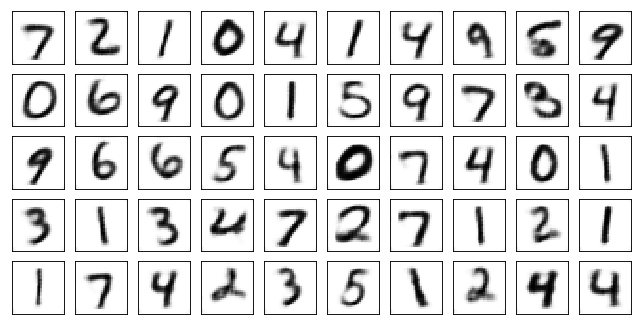

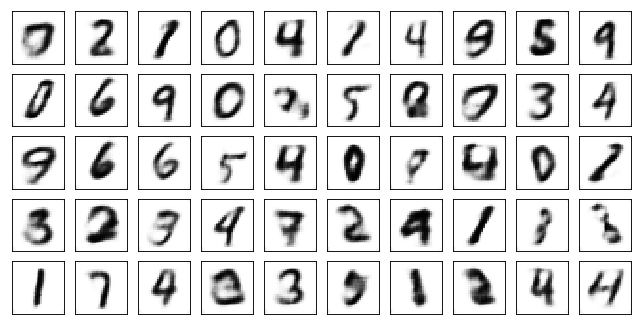

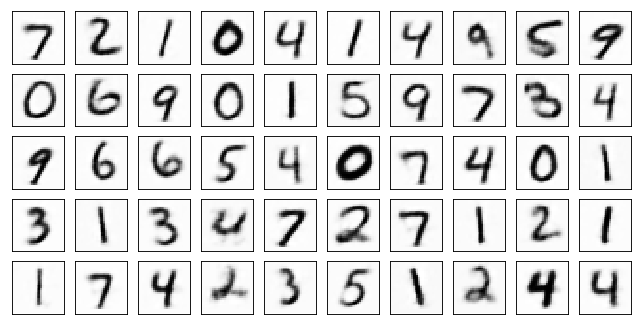

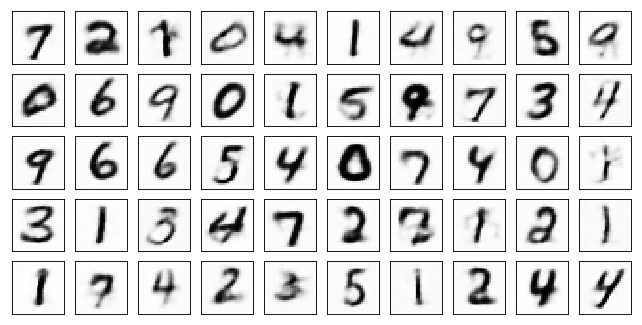

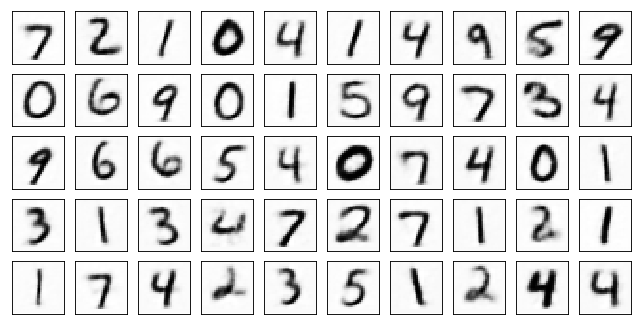

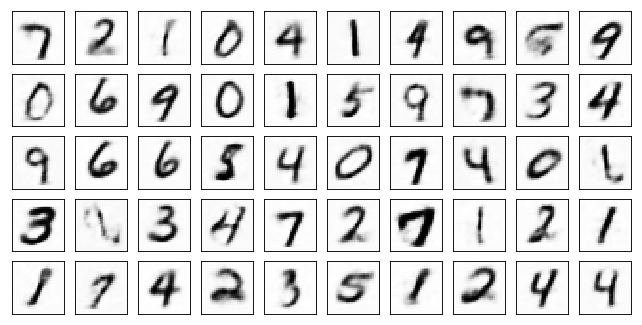

Test losses: VAE10: 0.0818/8.6192 VAE10+bn: 0.0808/8.1193 VAE10+bn+dp: 0.0835/7.6635
Train Epoch: 20 [0/50000 (0%)]	Losses VAE10: 0.1023 VAE10+bn: 0.1007 VAE10+bn+dp: 0.1023
Train Epoch: 20 [10000/50000 (20%)]	Losses VAE10: 0.1119 VAE10+bn: 0.1185 VAE10+bn+dp: 0.1144
Train Epoch: 20 [20000/50000 (40%)]	Losses VAE10: 0.1022 VAE10+bn: 0.1013 VAE10+bn+dp: 0.1022
Train Epoch: 20 [30000/50000 (60%)]	Losses VAE10: 0.1060 VAE10+bn: 0.1028 VAE10+bn+dp: 0.1047
Train Epoch: 20 [40000/50000 (80%)]	Losses VAE10: 0.0975 VAE10+bn: 0.0927 VAE10+bn+dp: 0.1013
Train Epoch: 20 [50000/50000 (100%)]	Losses VAE10: 0.0997 VAE10+bn: 0.0945 VAE10+bn+dp: 0.0983


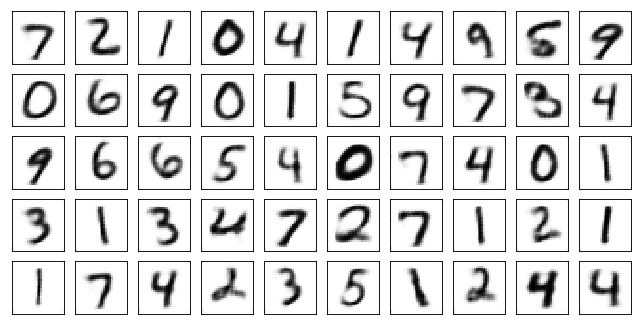

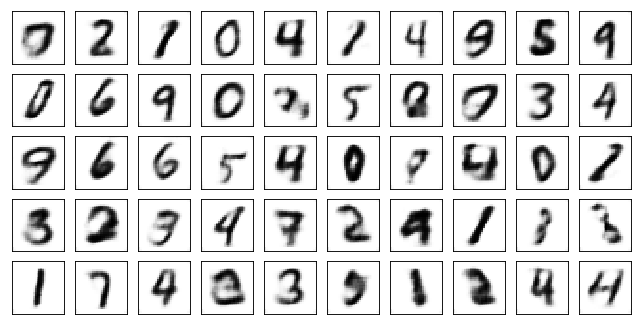

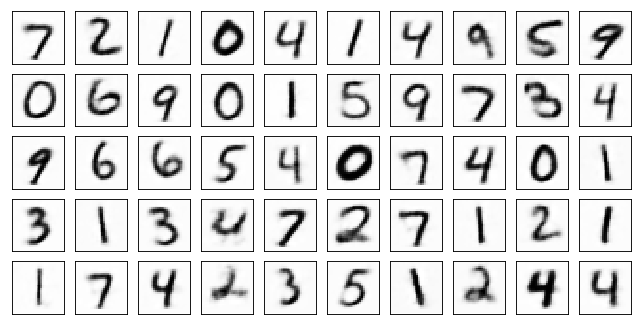

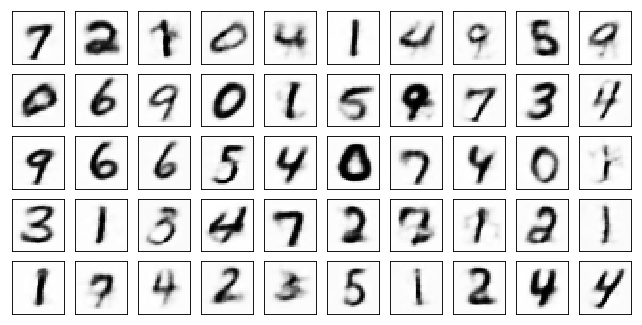

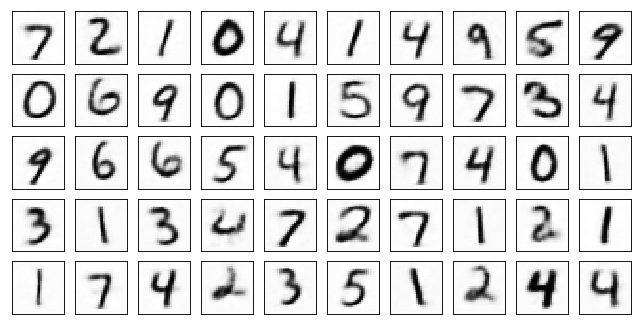

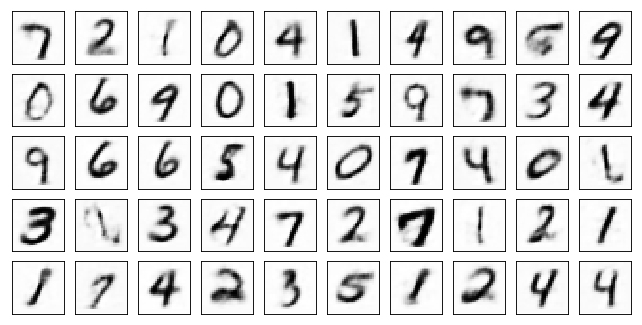

Test losses: VAE10: 0.0809/8.5701 VAE10+bn: 0.0795/8.2650 VAE10+bn+dp: 0.0824/7.7108
Train Epoch: 21 [0/50000 (0%)]	Losses VAE10: 0.0947 VAE10+bn: 0.0891 VAE10+bn+dp: 0.0970
Train Epoch: 21 [10000/50000 (20%)]	Losses VAE10: 0.0977 VAE10+bn: 0.0964 VAE10+bn+dp: 0.0984
Train Epoch: 21 [20000/50000 (40%)]	Losses VAE10: 0.0996 VAE10+bn: 0.1048 VAE10+bn+dp: 0.1040
Train Epoch: 21 [30000/50000 (60%)]	Losses VAE10: 0.0983 VAE10+bn: 0.0939 VAE10+bn+dp: 0.0987
Train Epoch: 21 [40000/50000 (80%)]	Losses VAE10: 0.1012 VAE10+bn: 0.0967 VAE10+bn+dp: 0.0962
Train Epoch: 21 [50000/50000 (100%)]	Losses VAE10: 0.1019 VAE10+bn: 0.1068 VAE10+bn+dp: 0.1046


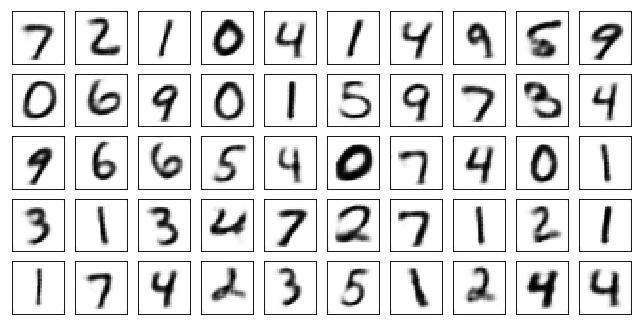

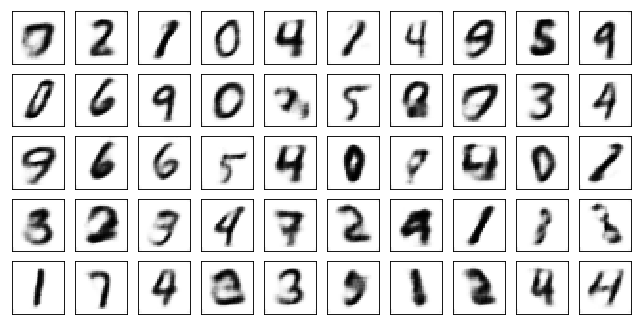

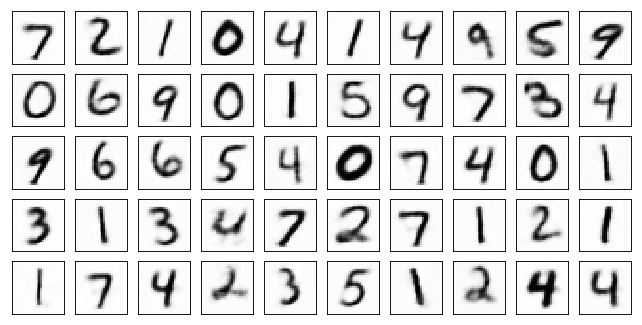

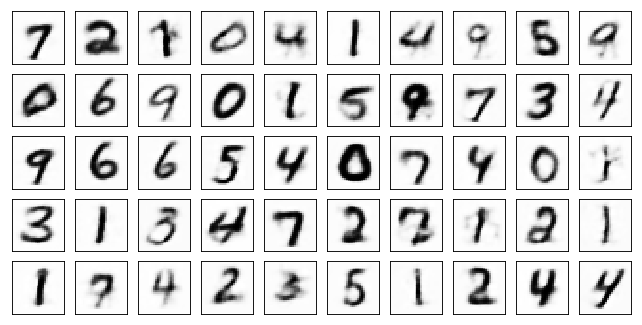

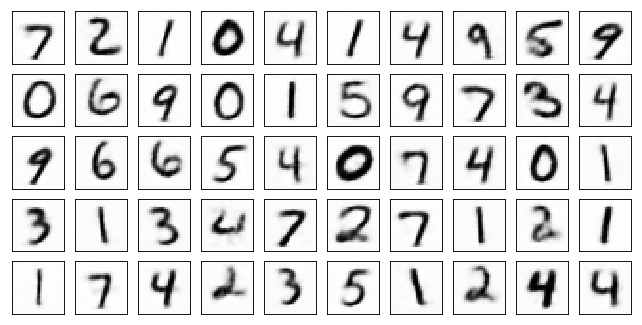

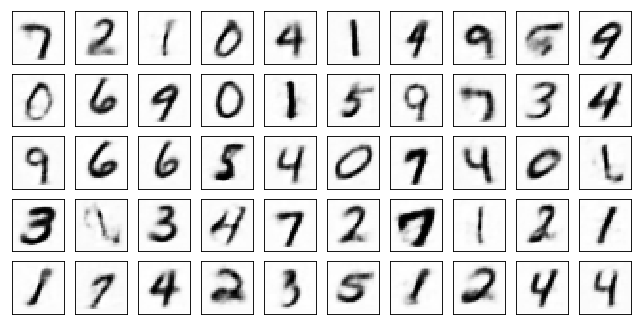

Test losses: VAE10: 0.0801/8.6714 VAE10+bn: 0.0789/8.2525 VAE10+bn+dp: 0.0815/7.7783
Train Epoch: 22 [0/50000 (0%)]	Losses VAE10: 0.0924 VAE10+bn: 0.0918 VAE10+bn+dp: 0.0937
Train Epoch: 22 [10000/50000 (20%)]	Losses VAE10: 0.0903 VAE10+bn: 0.0913 VAE10+bn+dp: 0.0933
Train Epoch: 22 [20000/50000 (40%)]	Losses VAE10: 0.1020 VAE10+bn: 0.0979 VAE10+bn+dp: 0.1014
Train Epoch: 22 [30000/50000 (60%)]	Losses VAE10: 0.0970 VAE10+bn: 0.0963 VAE10+bn+dp: 0.0913
Train Epoch: 22 [40000/50000 (80%)]	Losses VAE10: 0.1093 VAE10+bn: 0.1140 VAE10+bn+dp: 0.1190
Train Epoch: 22 [50000/50000 (100%)]	Losses VAE10: 0.0972 VAE10+bn: 0.0956 VAE10+bn+dp: 0.0924


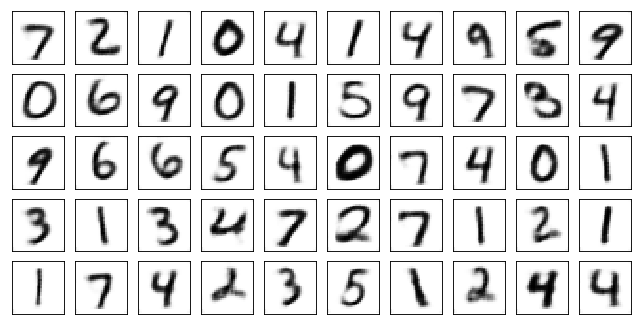

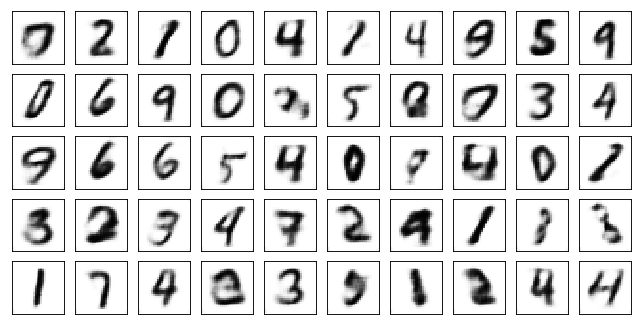

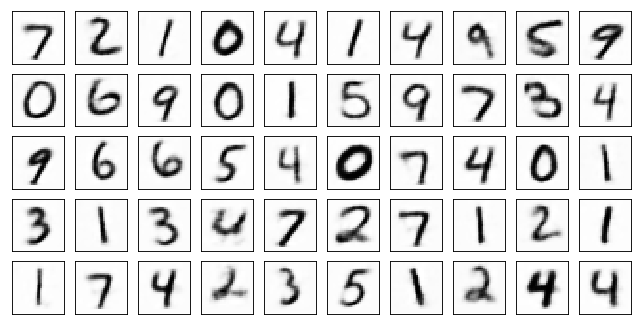

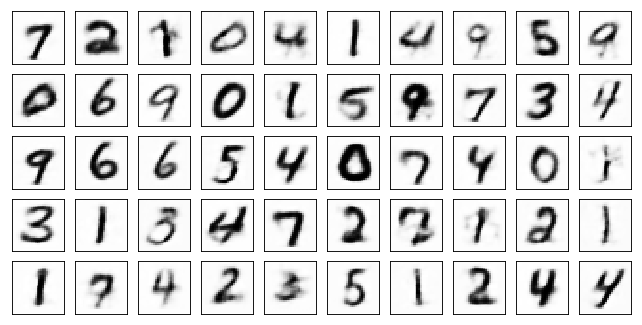

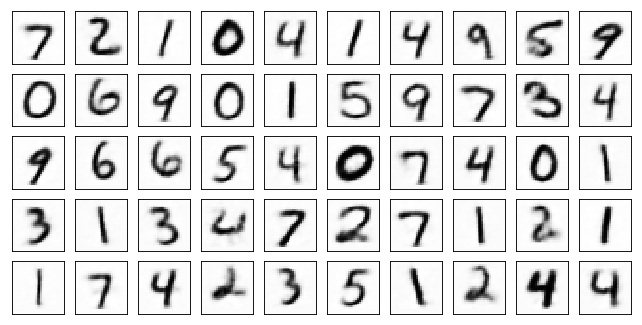

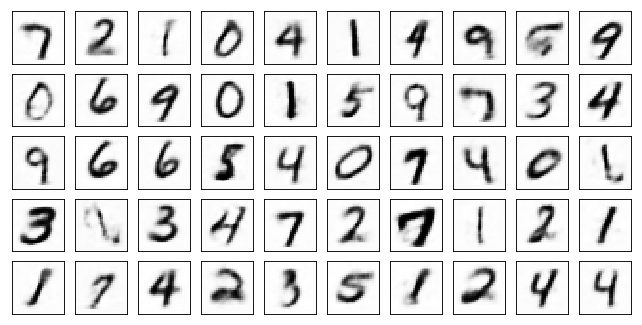

Test losses: VAE10: 0.0795/8.5288 VAE10+bn: 0.0783/8.2822 VAE10+bn+dp: 0.0810/7.8504
Train Epoch: 23 [0/50000 (0%)]	Losses VAE10: 0.0993 VAE10+bn: 0.0966 VAE10+bn+dp: 0.1007
Train Epoch: 23 [10000/50000 (20%)]	Losses VAE10: 0.0990 VAE10+bn: 0.0970 VAE10+bn+dp: 0.0960
Train Epoch: 23 [20000/50000 (40%)]	Losses VAE10: 0.1000 VAE10+bn: 0.0990 VAE10+bn+dp: 0.0973
Train Epoch: 23 [30000/50000 (60%)]	Losses VAE10: 0.0964 VAE10+bn: 0.0909 VAE10+bn+dp: 0.1002
Train Epoch: 23 [40000/50000 (80%)]	Losses VAE10: 0.1004 VAE10+bn: 0.0967 VAE10+bn+dp: 0.1015
Train Epoch: 23 [50000/50000 (100%)]	Losses VAE10: 0.0911 VAE10+bn: 0.0857 VAE10+bn+dp: 0.0850


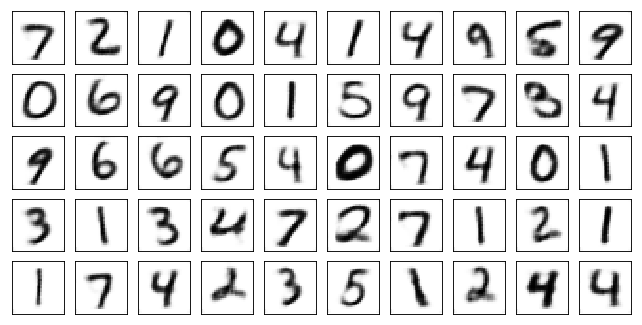

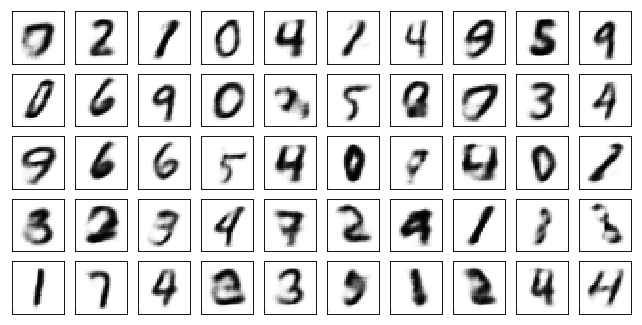

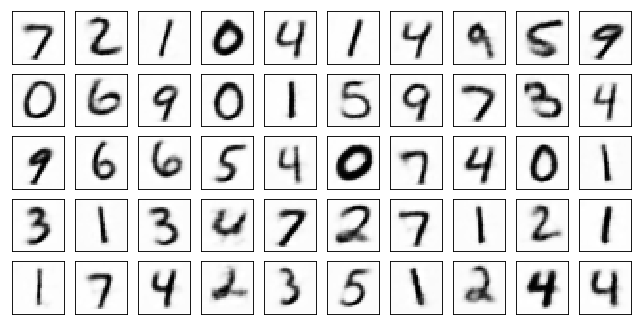

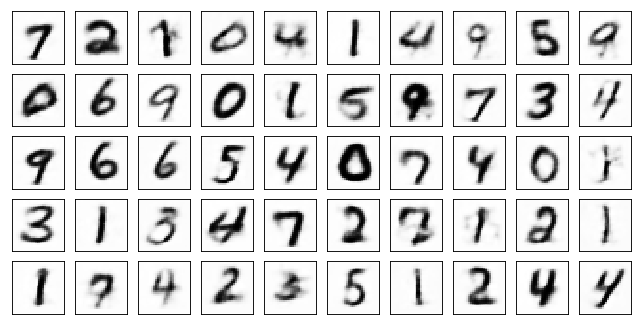

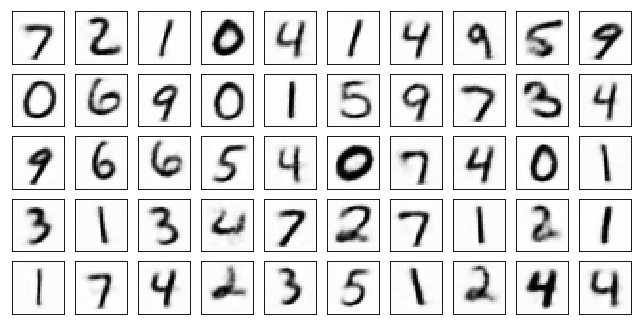

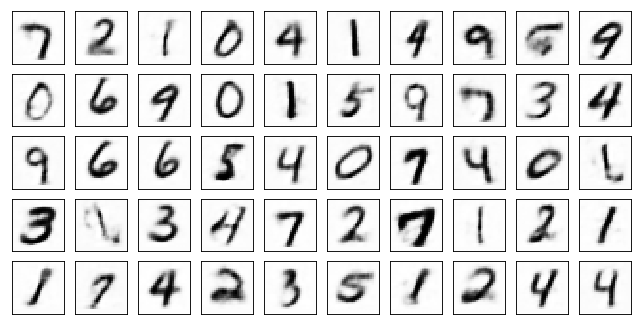

Test losses: VAE10: 0.0791/8.6877 VAE10+bn: 0.0771/8.3569 VAE10+bn+dp: 0.0804/7.8179
Train Epoch: 24 [0/50000 (0%)]	Losses VAE10: 0.0984 VAE10+bn: 0.0949 VAE10+bn+dp: 0.0947
Train Epoch: 24 [10000/50000 (20%)]	Losses VAE10: 0.1118 VAE10+bn: 0.1093 VAE10+bn+dp: 0.1106
Train Epoch: 24 [20000/50000 (40%)]	Losses VAE10: 0.0896 VAE10+bn: 0.0928 VAE10+bn+dp: 0.0889
Train Epoch: 24 [30000/50000 (60%)]	Losses VAE10: 0.0867 VAE10+bn: 0.0892 VAE10+bn+dp: 0.0901
Train Epoch: 24 [40000/50000 (80%)]	Losses VAE10: 0.0967 VAE10+bn: 0.0898 VAE10+bn+dp: 0.0930
Train Epoch: 24 [50000/50000 (100%)]	Losses VAE10: 0.0942 VAE10+bn: 0.0926 VAE10+bn+dp: 0.0955


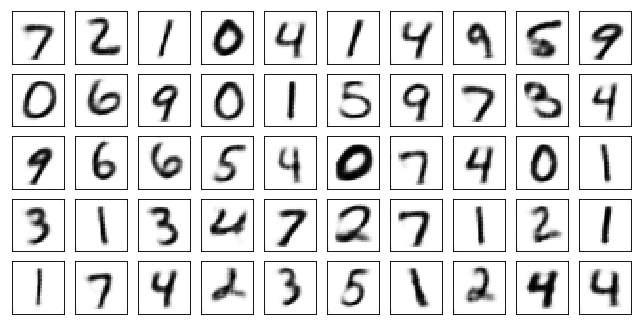

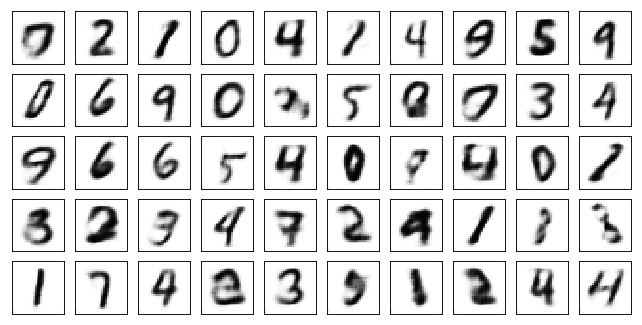

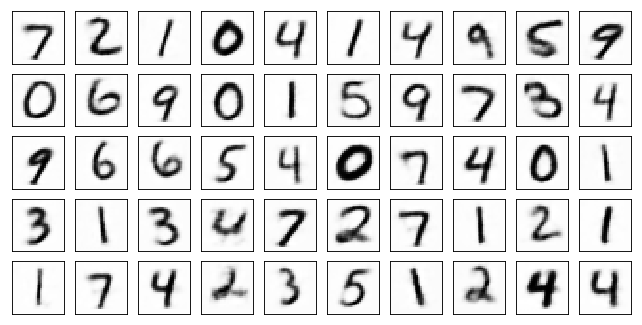

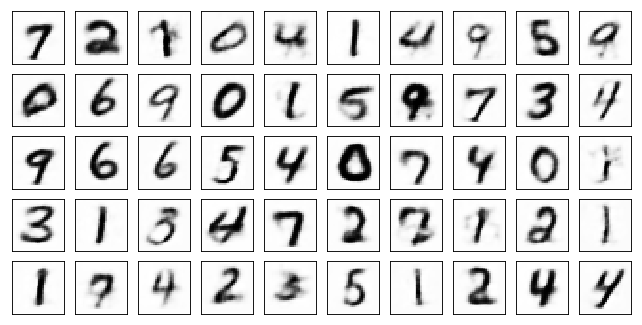

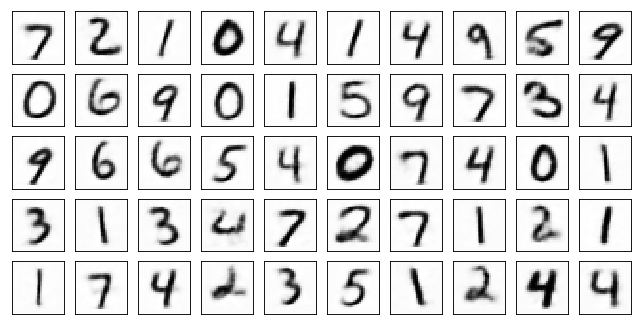

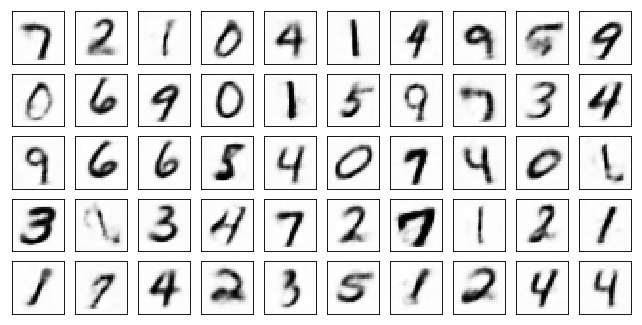

Test losses: VAE10: 0.0786/8.6459 VAE10+bn: 0.0766/8.4199 VAE10+bn+dp: 0.0796/7.9061
Train Epoch: 25 [0/50000 (0%)]	Losses VAE10: 0.0998 VAE10+bn: 0.0944 VAE10+bn+dp: 0.0994
Train Epoch: 25 [10000/50000 (20%)]	Losses VAE10: 0.0978 VAE10+bn: 0.0964 VAE10+bn+dp: 0.0962
Train Epoch: 25 [20000/50000 (40%)]	Losses VAE10: 0.0968 VAE10+bn: 0.0996 VAE10+bn+dp: 0.0981
Train Epoch: 25 [30000/50000 (60%)]	Losses VAE10: 0.0987 VAE10+bn: 0.1047 VAE10+bn+dp: 0.1037
Train Epoch: 25 [40000/50000 (80%)]	Losses VAE10: 0.0914 VAE10+bn: 0.0915 VAE10+bn+dp: 0.0867
Train Epoch: 25 [50000/50000 (100%)]	Losses VAE10: 0.1081 VAE10+bn: 0.1048 VAE10+bn+dp: 0.1056


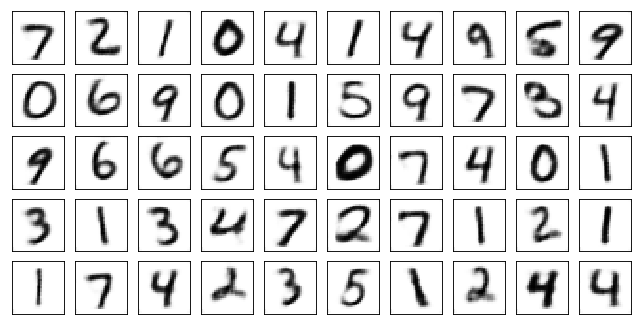

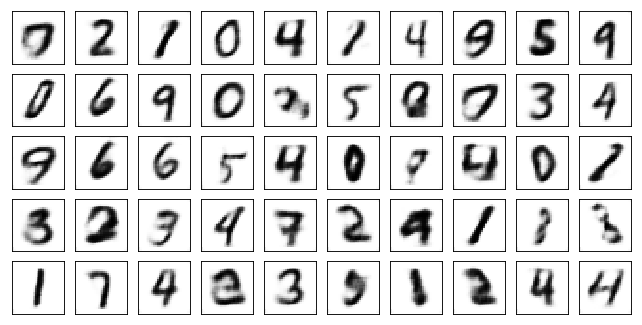

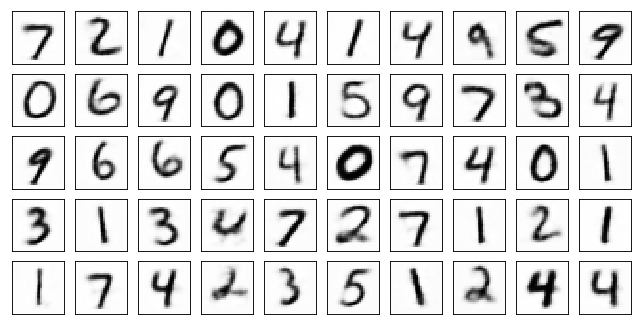

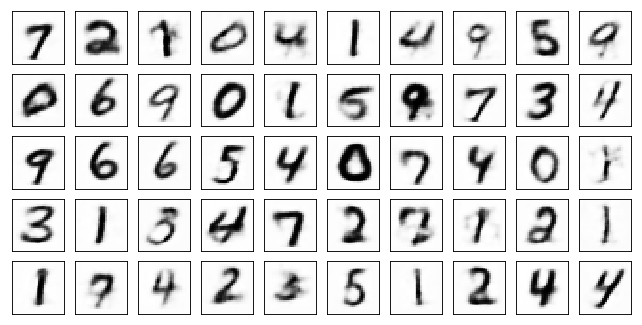

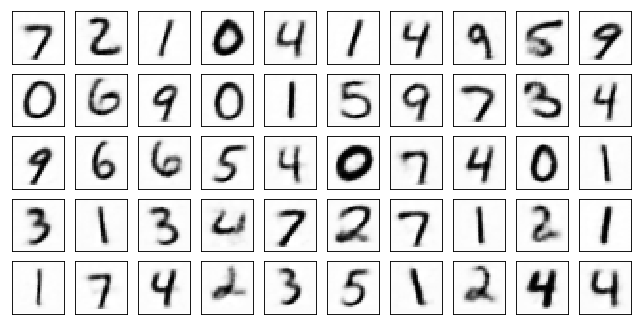

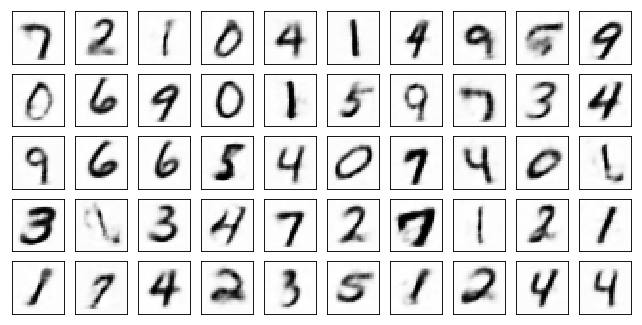

Test losses: VAE10: 0.0781/8.6799 VAE10+bn: 0.0764/8.3055 VAE10+bn+dp: 0.0795/7.8730
Train Epoch: 26 [0/50000 (0%)]	Losses VAE10: 0.0970 VAE10+bn: 0.1076 VAE10+bn+dp: 0.1068
Train Epoch: 26 [10000/50000 (20%)]	Losses VAE10: 0.0985 VAE10+bn: 0.0972 VAE10+bn+dp: 0.0980
Train Epoch: 26 [20000/50000 (40%)]	Losses VAE10: 0.1006 VAE10+bn: 0.0981 VAE10+bn+dp: 0.1013
Train Epoch: 26 [30000/50000 (60%)]	Losses VAE10: 0.0972 VAE10+bn: 0.0938 VAE10+bn+dp: 0.0985
Train Epoch: 26 [40000/50000 (80%)]	Losses VAE10: 0.0894 VAE10+bn: 0.0783 VAE10+bn+dp: 0.0895
Train Epoch: 26 [50000/50000 (100%)]	Losses VAE10: 0.1008 VAE10+bn: 0.1008 VAE10+bn+dp: 0.0987


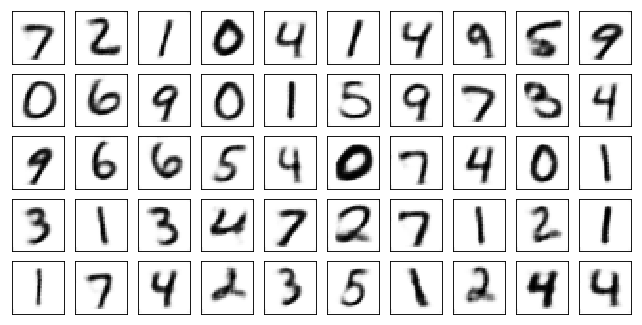

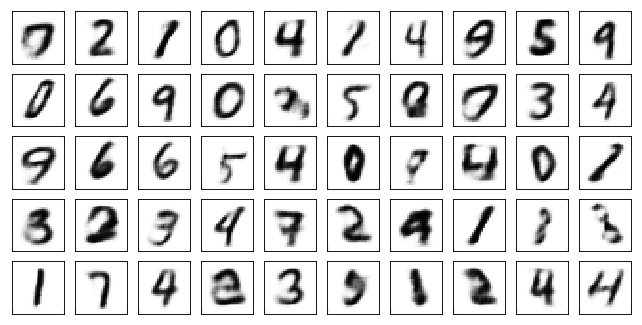

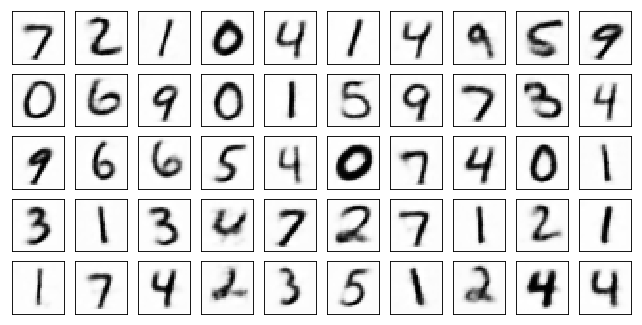

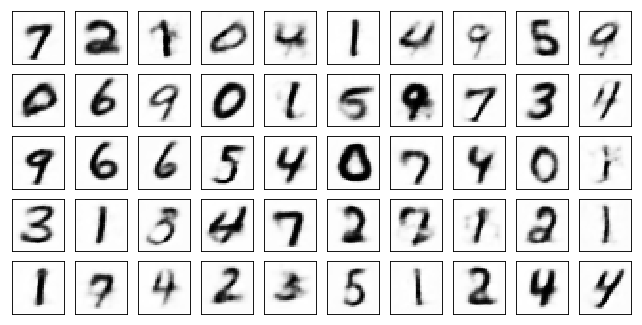

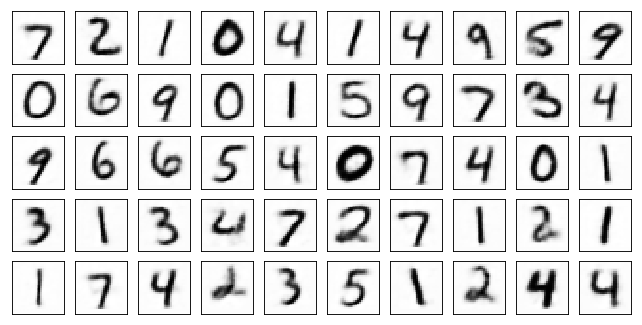

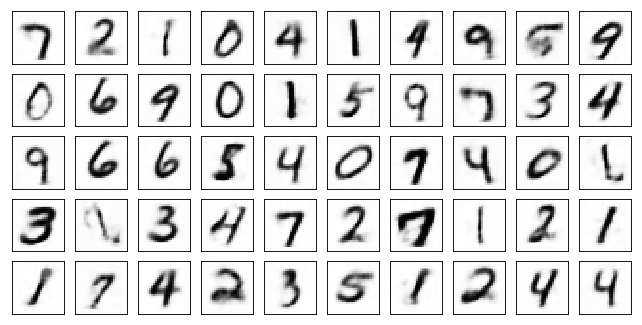

Test losses: VAE10: 0.0773/8.8042 VAE10+bn: 0.0764/8.3631 VAE10+bn+dp: 0.0788/7.8713
Train Epoch: 27 [0/50000 (0%)]	Losses VAE10: 0.1079 VAE10+bn: 0.1070 VAE10+bn+dp: 0.1079
Train Epoch: 27 [10000/50000 (20%)]	Losses VAE10: 0.0983 VAE10+bn: 0.1017 VAE10+bn+dp: 0.1023
Train Epoch: 27 [20000/50000 (40%)]	Losses VAE10: 0.1001 VAE10+bn: 0.1048 VAE10+bn+dp: 0.1045
Train Epoch: 27 [30000/50000 (60%)]	Losses VAE10: 0.1091 VAE10+bn: 0.1010 VAE10+bn+dp: 0.1032
Train Epoch: 27 [40000/50000 (80%)]	Losses VAE10: 0.0973 VAE10+bn: 0.0995 VAE10+bn+dp: 0.1012
Train Epoch: 27 [50000/50000 (100%)]	Losses VAE10: 0.1040 VAE10+bn: 0.1022 VAE10+bn+dp: 0.0966


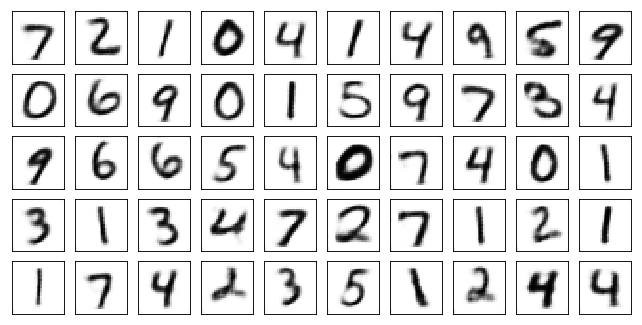

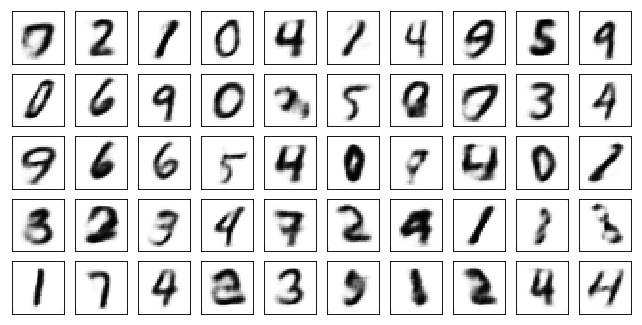

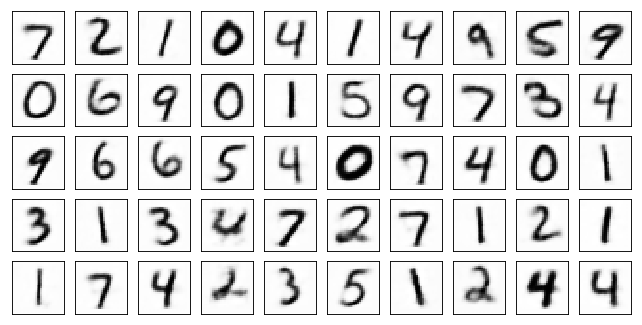

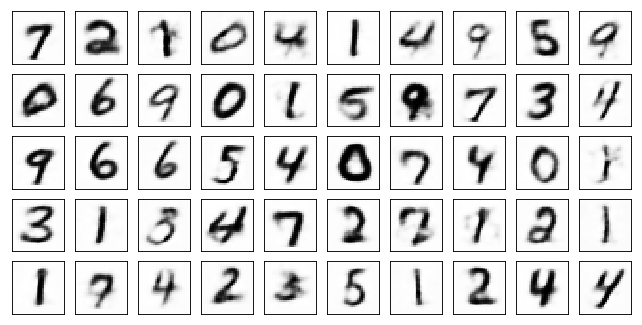

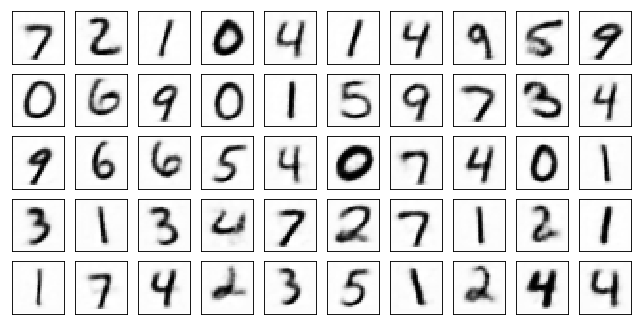

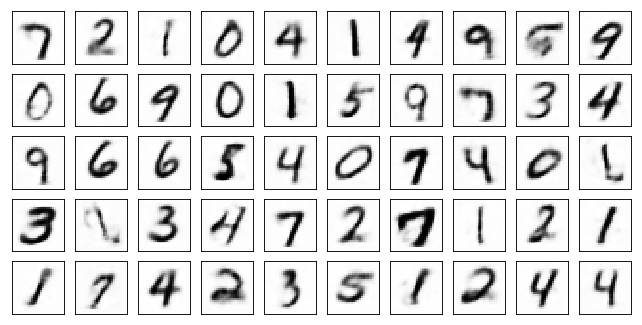

Test losses: VAE10: 0.0769/8.7294 VAE10+bn: 0.0756/8.3997 VAE10+bn+dp: 0.0786/7.9025
Train Epoch: 28 [0/50000 (0%)]	Losses VAE10: 0.0998 VAE10+bn: 0.1001 VAE10+bn+dp: 0.0989
Train Epoch: 28 [10000/50000 (20%)]	Losses VAE10: 0.0917 VAE10+bn: 0.0941 VAE10+bn+dp: 0.0932
Train Epoch: 28 [20000/50000 (40%)]	Losses VAE10: 0.0873 VAE10+bn: 0.0869 VAE10+bn+dp: 0.0879
Train Epoch: 28 [30000/50000 (60%)]	Losses VAE10: 0.1054 VAE10+bn: 0.0981 VAE10+bn+dp: 0.0992
Train Epoch: 28 [40000/50000 (80%)]	Losses VAE10: 0.1008 VAE10+bn: 0.0991 VAE10+bn+dp: 0.1027
Train Epoch: 28 [50000/50000 (100%)]	Losses VAE10: 0.0971 VAE10+bn: 0.0907 VAE10+bn+dp: 0.0907


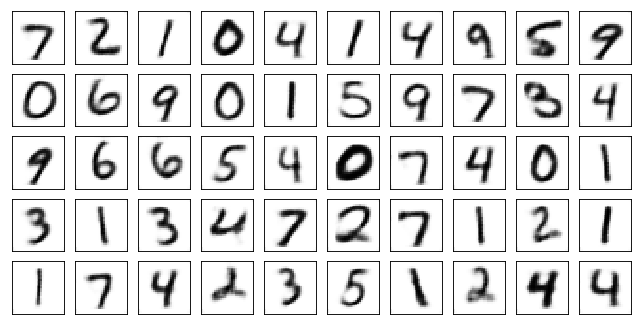

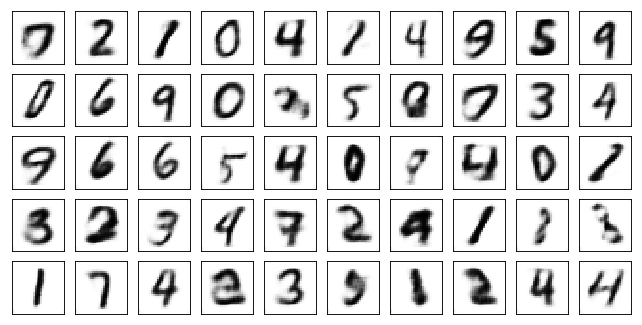

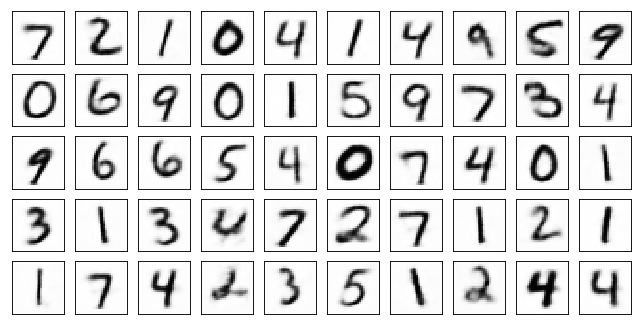

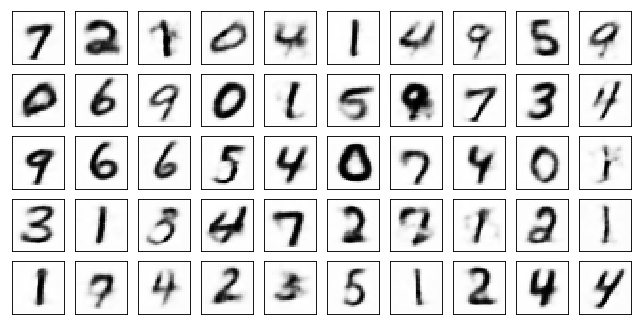

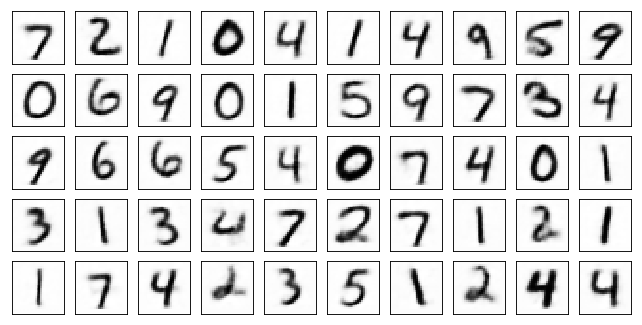

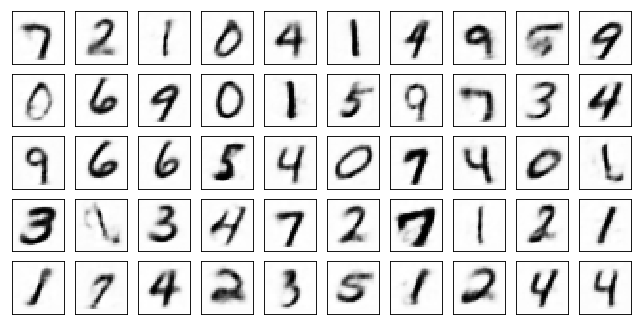

Test losses: VAE10: 0.0768/8.7355 VAE10+bn: 0.0750/8.4524 VAE10+bn+dp: 0.0778/8.0015
Train Epoch: 29 [0/50000 (0%)]	Losses VAE10: 0.0936 VAE10+bn: 0.0927 VAE10+bn+dp: 0.0922
Train Epoch: 29 [10000/50000 (20%)]	Losses VAE10: 0.0925 VAE10+bn: 0.0971 VAE10+bn+dp: 0.0945
Train Epoch: 29 [20000/50000 (40%)]	Losses VAE10: 0.1073 VAE10+bn: 0.1027 VAE10+bn+dp: 0.1074
Train Epoch: 29 [30000/50000 (60%)]	Losses VAE10: 0.0945 VAE10+bn: 0.0883 VAE10+bn+dp: 0.0896
Train Epoch: 29 [40000/50000 (80%)]	Losses VAE10: 0.1076 VAE10+bn: 0.1075 VAE10+bn+dp: 0.1121
Train Epoch: 29 [50000/50000 (100%)]	Losses VAE10: 0.0941 VAE10+bn: 0.0872 VAE10+bn+dp: 0.0891


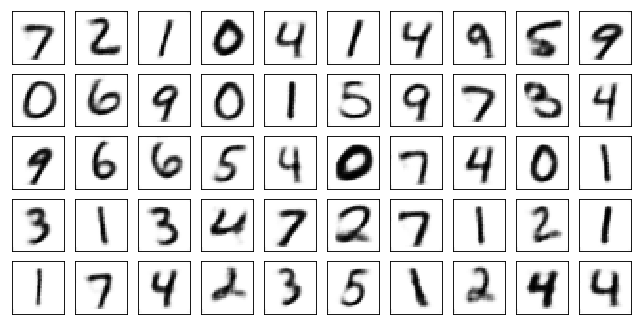

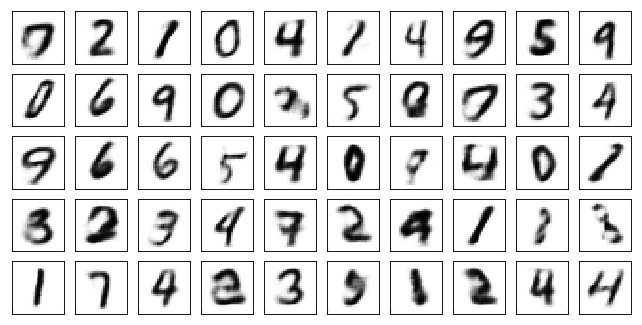

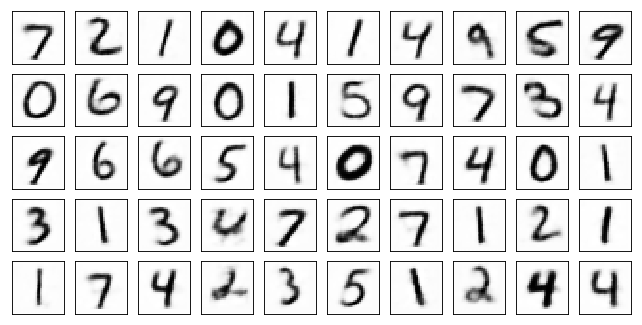

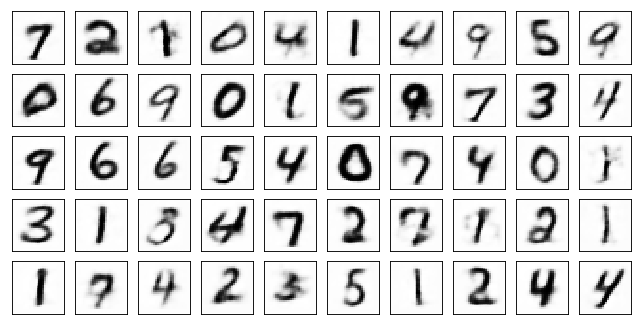

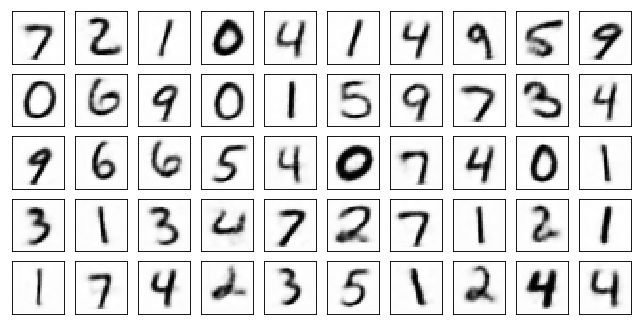

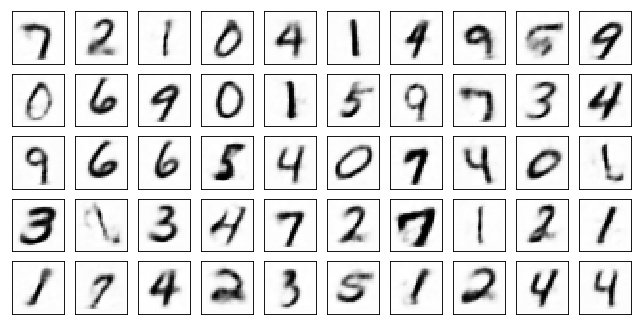

Test losses: VAE10: 0.0763/8.6719 VAE10+bn: 0.0743/8.4930 VAE10+bn+dp: 0.0773/7.9168
Train Epoch: 30 [0/50000 (0%)]	Losses VAE10: 0.1073 VAE10+bn: 0.1067 VAE10+bn+dp: 0.1046
Train Epoch: 30 [10000/50000 (20%)]	Losses VAE10: 0.0874 VAE10+bn: 0.0921 VAE10+bn+dp: 0.0893
Train Epoch: 30 [20000/50000 (40%)]	Losses VAE10: 0.0920 VAE10+bn: 0.0989 VAE10+bn+dp: 0.0957
Train Epoch: 30 [30000/50000 (60%)]	Losses VAE10: 0.1060 VAE10+bn: 0.1022 VAE10+bn+dp: 0.1038
Train Epoch: 30 [40000/50000 (80%)]	Losses VAE10: 0.0994 VAE10+bn: 0.0935 VAE10+bn+dp: 0.1001
Train Epoch: 30 [50000/50000 (100%)]	Losses VAE10: 0.0839 VAE10+bn: 0.0863 VAE10+bn+dp: 0.0851


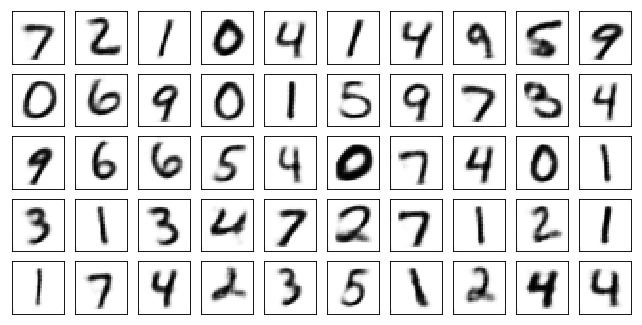

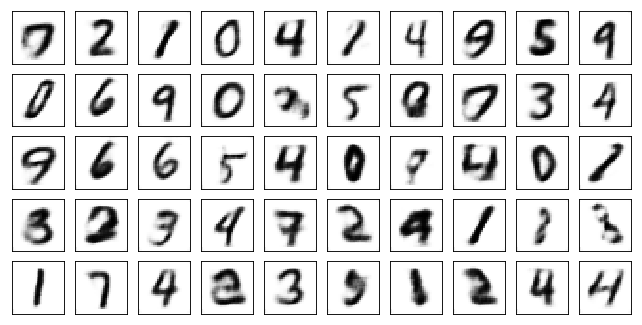

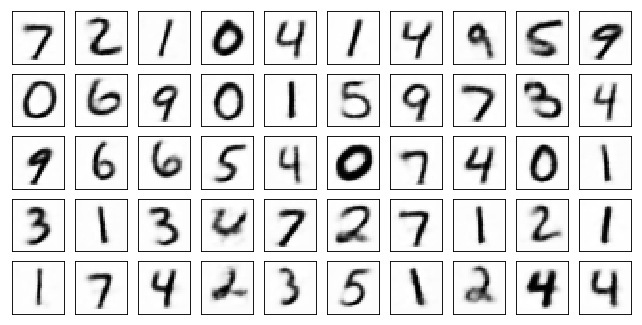

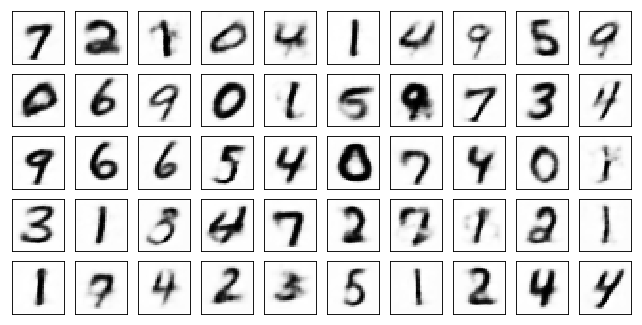

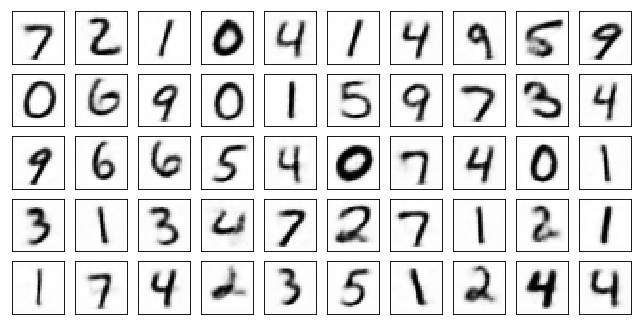

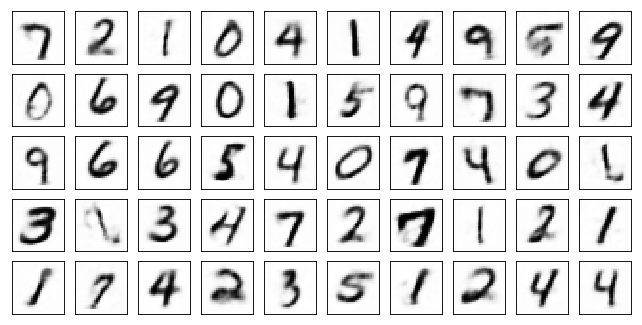

Test losses: VAE10: 0.0757/8.8039 VAE10+bn: 0.0745/8.4811 VAE10+bn+dp: 0.0773/8.0434
Train Epoch: 31 [0/50000 (0%)]	Losses VAE10: 0.0949 VAE10+bn: 0.0947 VAE10+bn+dp: 0.0953
Train Epoch: 31 [10000/50000 (20%)]	Losses VAE10: 0.1009 VAE10+bn: 0.0966 VAE10+bn+dp: 0.1053
Train Epoch: 31 [20000/50000 (40%)]	Losses VAE10: 0.1015 VAE10+bn: 0.0970 VAE10+bn+dp: 0.0965
Train Epoch: 31 [30000/50000 (60%)]	Losses VAE10: 0.0932 VAE10+bn: 0.0953 VAE10+bn+dp: 0.0960
Train Epoch: 31 [40000/50000 (80%)]	Losses VAE10: 0.1012 VAE10+bn: 0.0993 VAE10+bn+dp: 0.1013
Train Epoch: 31 [50000/50000 (100%)]	Losses VAE10: 0.0938 VAE10+bn: 0.0897 VAE10+bn+dp: 0.0906


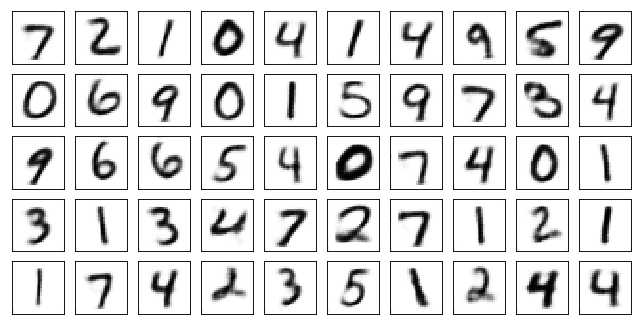

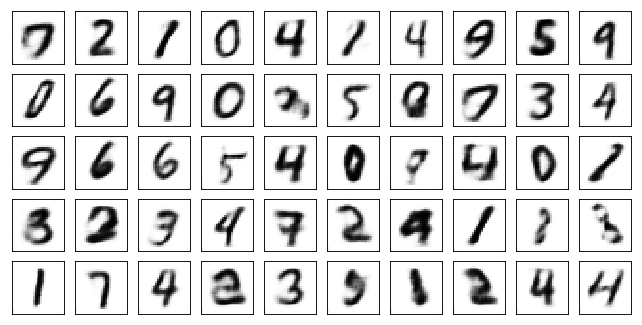

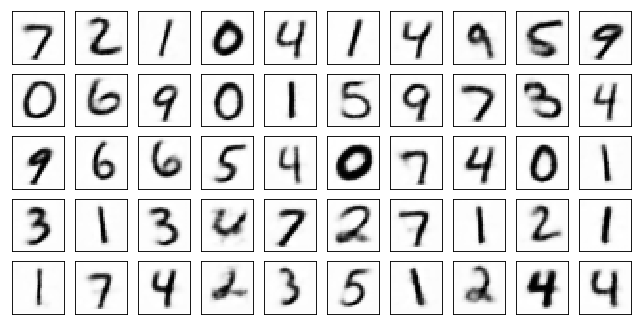

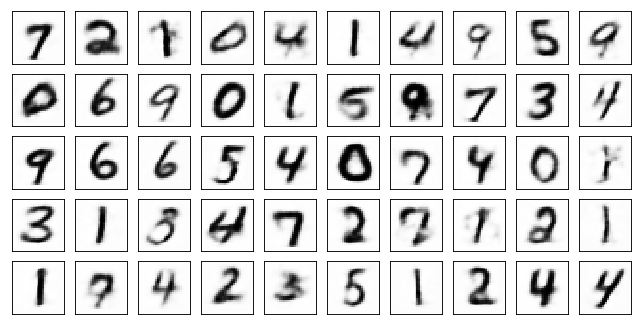

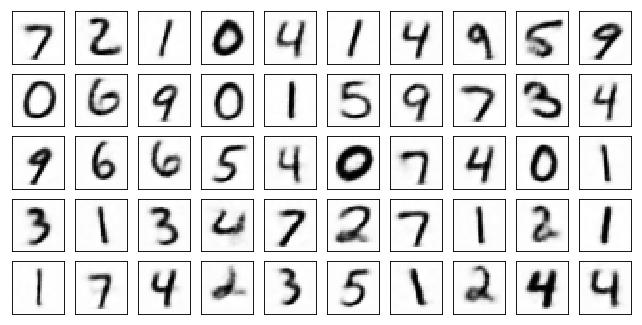

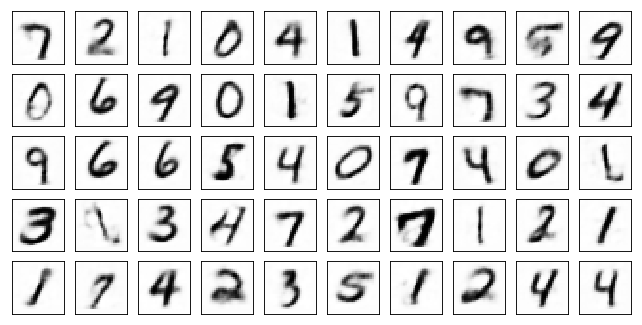

Test losses: VAE10: 0.0756/8.6896 VAE10+bn: 0.0740/8.5273 VAE10+bn+dp: 0.0768/7.9763
Train Epoch: 32 [0/50000 (0%)]	Losses VAE10: 0.0890 VAE10+bn: 0.0895 VAE10+bn+dp: 0.0884
Train Epoch: 32 [10000/50000 (20%)]	Losses VAE10: 0.0833 VAE10+bn: 0.0819 VAE10+bn+dp: 0.0828
Train Epoch: 32 [20000/50000 (40%)]	Losses VAE10: 0.0950 VAE10+bn: 0.0991 VAE10+bn+dp: 0.1038
Train Epoch: 32 [30000/50000 (60%)]	Losses VAE10: 0.0917 VAE10+bn: 0.0934 VAE10+bn+dp: 0.0944
Train Epoch: 32 [40000/50000 (80%)]	Losses VAE10: 0.0843 VAE10+bn: 0.0854 VAE10+bn+dp: 0.0851
Train Epoch: 32 [50000/50000 (100%)]	Losses VAE10: 0.0957 VAE10+bn: 0.0930 VAE10+bn+dp: 0.0940


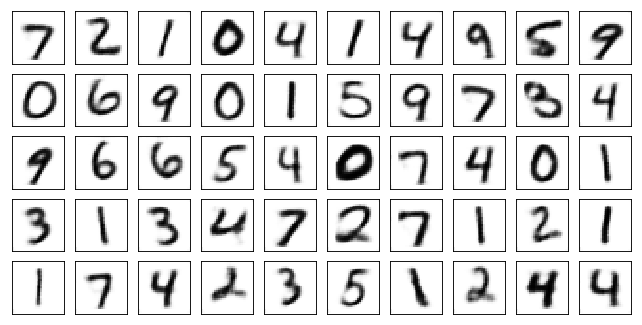

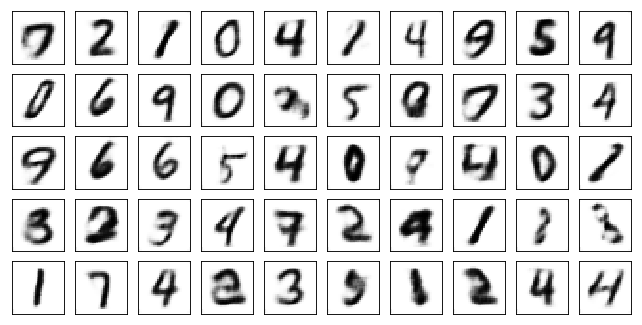

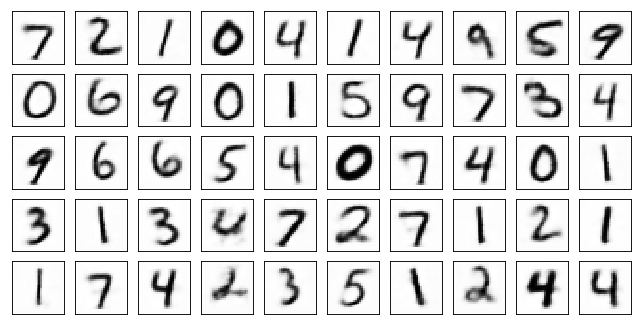

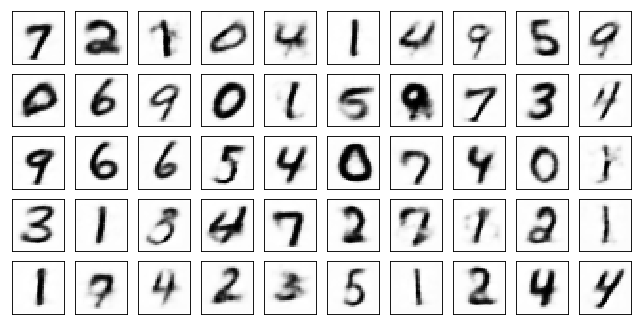

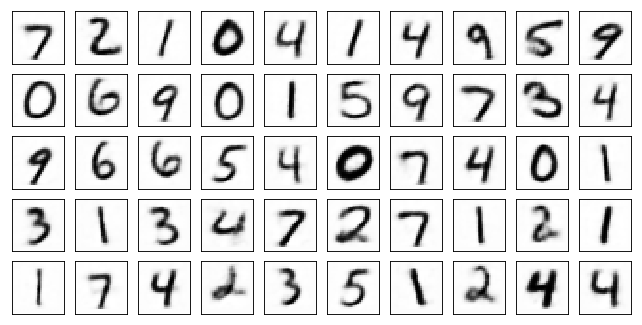

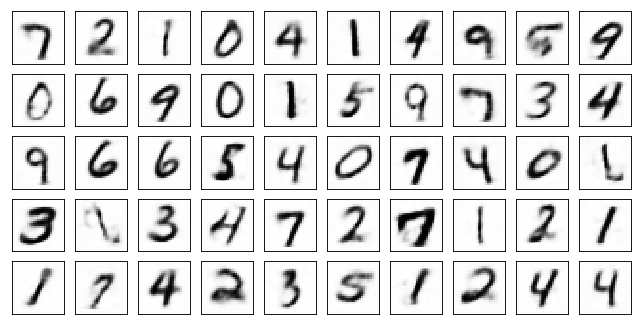

Test losses: VAE10: 0.0749/8.9385 VAE10+bn: 0.0735/8.4863 VAE10+bn+dp: 0.0763/7.9773
Train Epoch: 33 [0/50000 (0%)]	Losses VAE10: 0.0965 VAE10+bn: 0.0951 VAE10+bn+dp: 0.0981
Train Epoch: 33 [10000/50000 (20%)]	Losses VAE10: 0.1029 VAE10+bn: 0.1016 VAE10+bn+dp: 0.0997
Train Epoch: 33 [20000/50000 (40%)]	Losses VAE10: 0.0940 VAE10+bn: 0.0986 VAE10+bn+dp: 0.0977
Train Epoch: 33 [30000/50000 (60%)]	Losses VAE10: 0.0912 VAE10+bn: 0.0899 VAE10+bn+dp: 0.0865
Train Epoch: 33 [40000/50000 (80%)]	Losses VAE10: 0.0915 VAE10+bn: 0.0967 VAE10+bn+dp: 0.0966
Train Epoch: 33 [50000/50000 (100%)]	Losses VAE10: 0.0966 VAE10+bn: 0.1002 VAE10+bn+dp: 0.0964


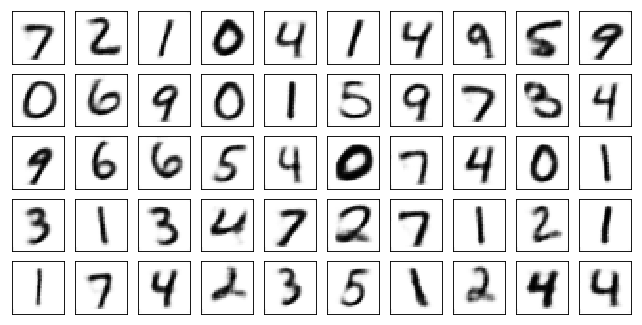

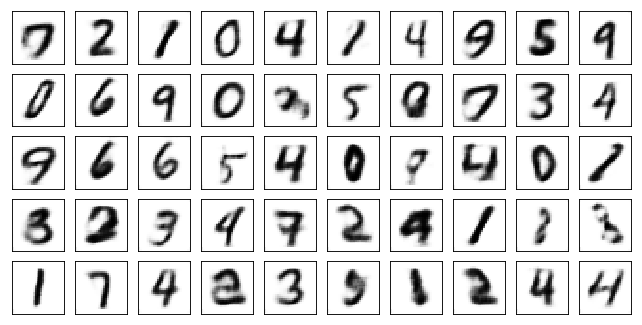

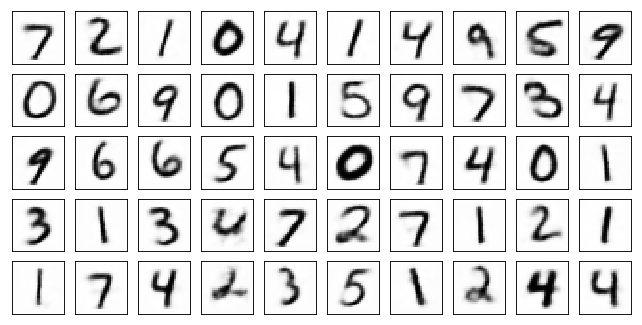

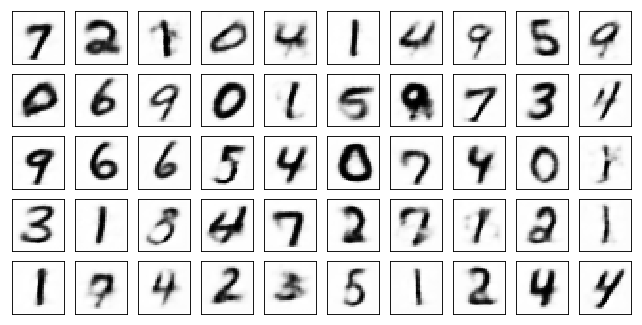

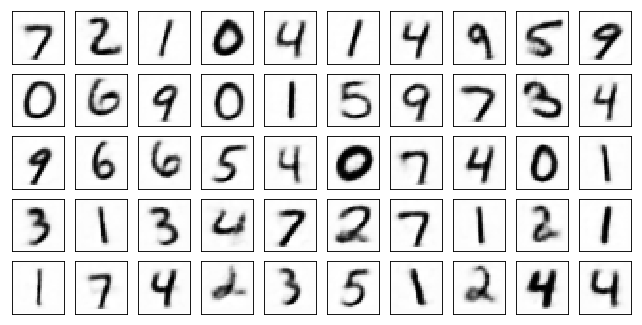

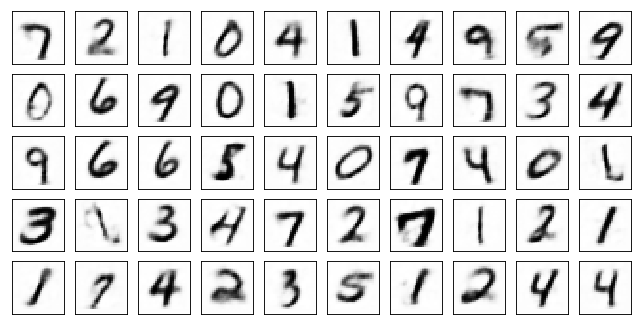

Test losses: VAE10: 0.0749/8.8329 VAE10+bn: 0.0731/8.5051 VAE10+bn+dp: 0.0764/7.9910
Train Epoch: 34 [0/50000 (0%)]	Losses VAE10: 0.0962 VAE10+bn: 0.0999 VAE10+bn+dp: 0.1041
Train Epoch: 34 [10000/50000 (20%)]	Losses VAE10: 0.0880 VAE10+bn: 0.0949 VAE10+bn+dp: 0.0935
Train Epoch: 34 [20000/50000 (40%)]	Losses VAE10: 0.0977 VAE10+bn: 0.0959 VAE10+bn+dp: 0.0970
Train Epoch: 34 [30000/50000 (60%)]	Losses VAE10: 0.0966 VAE10+bn: 0.1000 VAE10+bn+dp: 0.1045
Train Epoch: 34 [40000/50000 (80%)]	Losses VAE10: 0.1024 VAE10+bn: 0.0999 VAE10+bn+dp: 0.1005
Train Epoch: 34 [50000/50000 (100%)]	Losses VAE10: 0.1010 VAE10+bn: 0.0946 VAE10+bn+dp: 0.0932


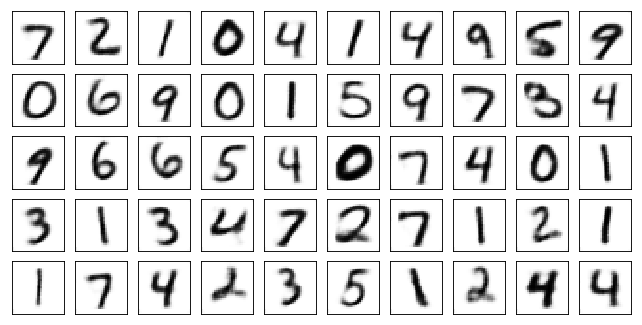

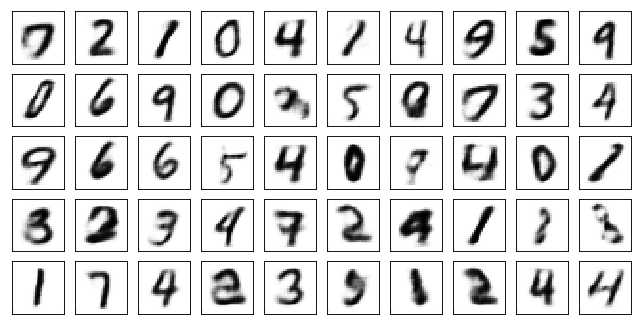

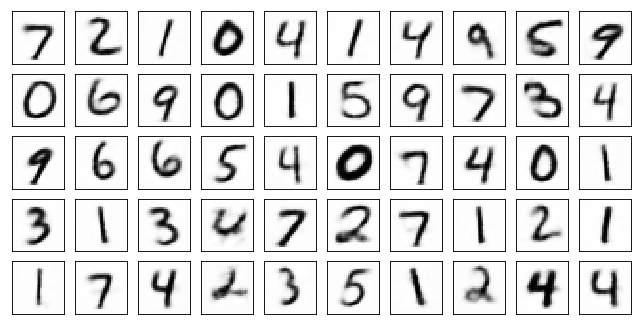

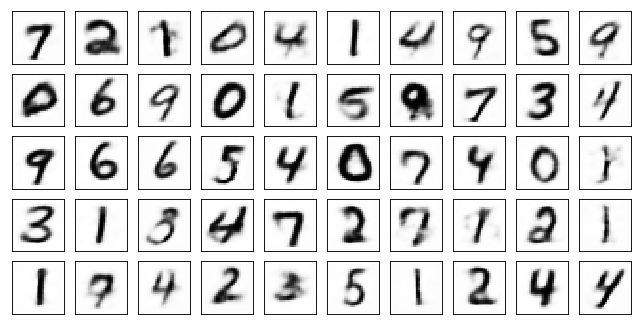

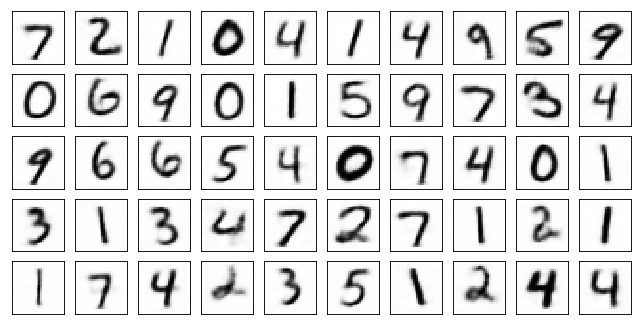

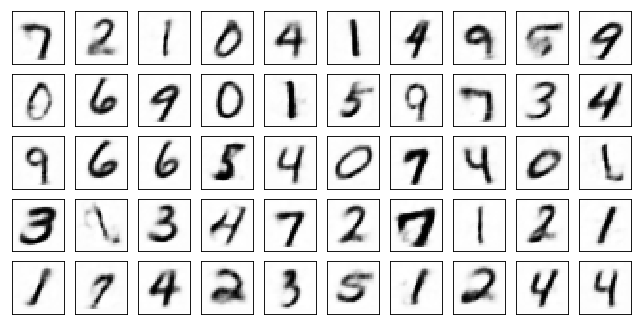

Test losses: VAE10: 0.0745/8.8822 VAE10+bn: 0.0729/8.5149 VAE10+bn+dp: 0.0757/8.0579
Train Epoch: 35 [0/50000 (0%)]	Losses VAE10: 0.0955 VAE10+bn: 0.0928 VAE10+bn+dp: 0.0943
Train Epoch: 35 [10000/50000 (20%)]	Losses VAE10: 0.0975 VAE10+bn: 0.0962 VAE10+bn+dp: 0.1007
Train Epoch: 35 [20000/50000 (40%)]	Losses VAE10: 0.0881 VAE10+bn: 0.0937 VAE10+bn+dp: 0.0864
Train Epoch: 35 [30000/50000 (60%)]	Losses VAE10: 0.0938 VAE10+bn: 0.0947 VAE10+bn+dp: 0.0951
Train Epoch: 35 [40000/50000 (80%)]	Losses VAE10: 0.0995 VAE10+bn: 0.0981 VAE10+bn+dp: 0.0973
Train Epoch: 35 [50000/50000 (100%)]	Losses VAE10: 0.0928 VAE10+bn: 0.0861 VAE10+bn+dp: 0.0906


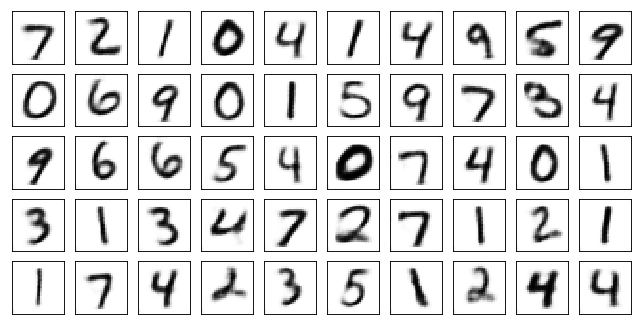

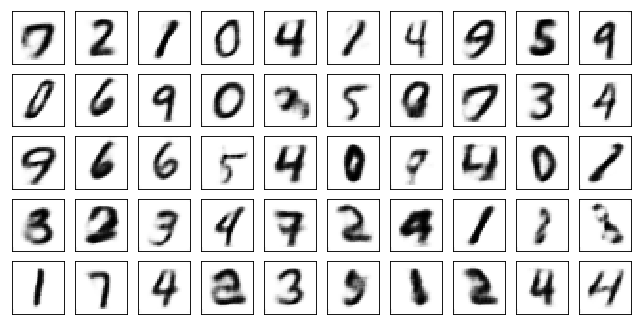

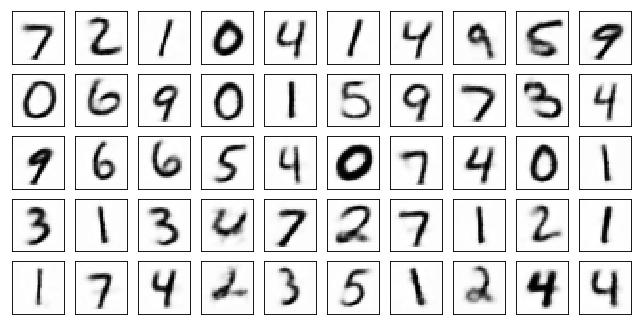

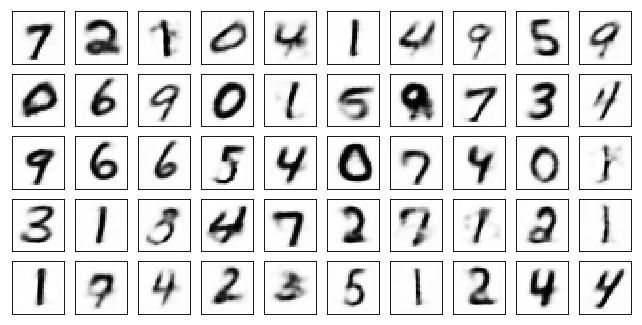

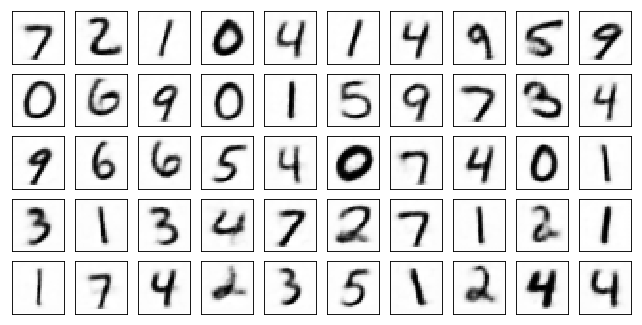

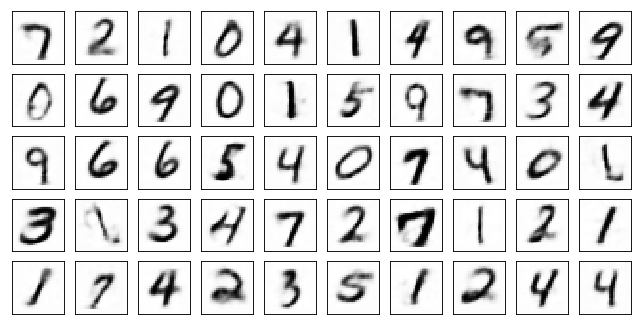

Test losses: VAE10: 0.0742/8.9346 VAE10+bn: 0.0729/8.6123 VAE10+bn+dp: 0.0756/8.1039
Train Epoch: 36 [0/50000 (0%)]	Losses VAE10: 0.0927 VAE10+bn: 0.0936 VAE10+bn+dp: 0.0924
Train Epoch: 36 [10000/50000 (20%)]	Losses VAE10: 0.1011 VAE10+bn: 0.1007 VAE10+bn+dp: 0.0945
Train Epoch: 36 [20000/50000 (40%)]	Losses VAE10: 0.0934 VAE10+bn: 0.0933 VAE10+bn+dp: 0.0916
Train Epoch: 36 [30000/50000 (60%)]	Losses VAE10: 0.1121 VAE10+bn: 0.1088 VAE10+bn+dp: 0.1084
Train Epoch: 36 [40000/50000 (80%)]	Losses VAE10: 0.0930 VAE10+bn: 0.0898 VAE10+bn+dp: 0.0959
Train Epoch: 36 [50000/50000 (100%)]	Losses VAE10: 0.0925 VAE10+bn: 0.0939 VAE10+bn+dp: 0.0905


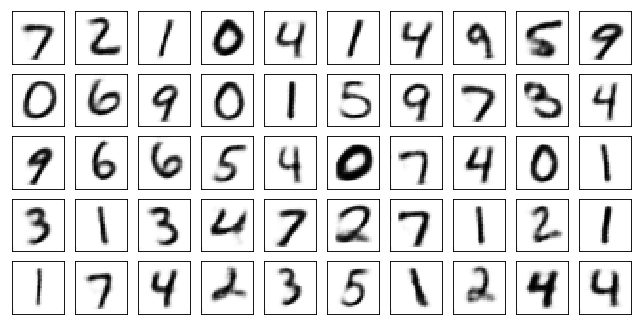

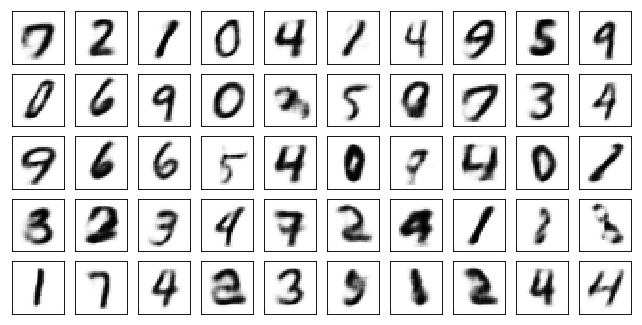

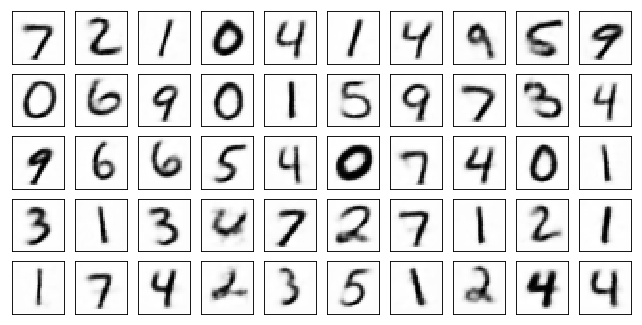

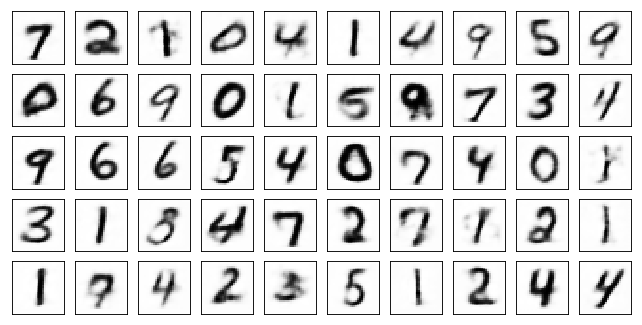

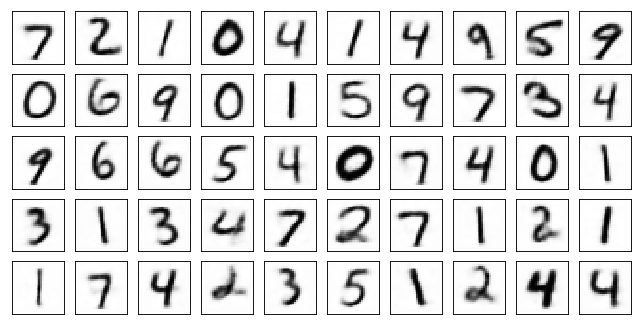

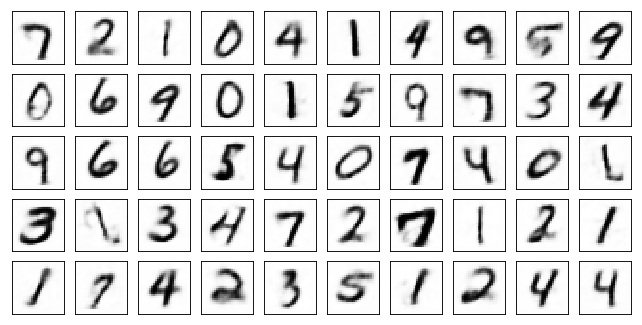

Test losses: VAE10: 0.0740/8.7914 VAE10+bn: 0.0731/8.4465 VAE10+bn+dp: 0.0755/8.0155
Train Epoch: 37 [0/50000 (0%)]	Losses VAE10: 0.0871 VAE10+bn: 0.0906 VAE10+bn+dp: 0.0919
Train Epoch: 37 [10000/50000 (20%)]	Losses VAE10: 0.0884 VAE10+bn: 0.0853 VAE10+bn+dp: 0.0934
Train Epoch: 37 [20000/50000 (40%)]	Losses VAE10: 0.0823 VAE10+bn: 0.0814 VAE10+bn+dp: 0.0853
Train Epoch: 37 [30000/50000 (60%)]	Losses VAE10: 0.0979 VAE10+bn: 0.0988 VAE10+bn+dp: 0.0982
Train Epoch: 37 [40000/50000 (80%)]	Losses VAE10: 0.0835 VAE10+bn: 0.0858 VAE10+bn+dp: 0.0835
Train Epoch: 37 [50000/50000 (100%)]	Losses VAE10: 0.1018 VAE10+bn: 0.0921 VAE10+bn+dp: 0.0968


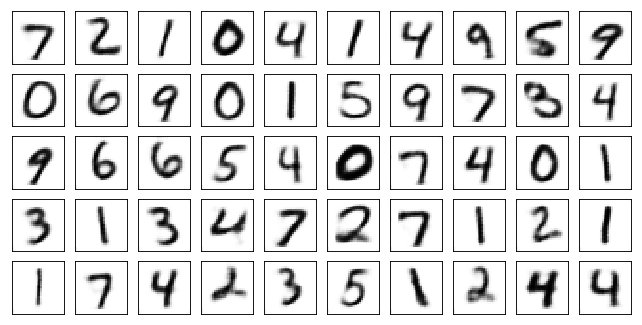

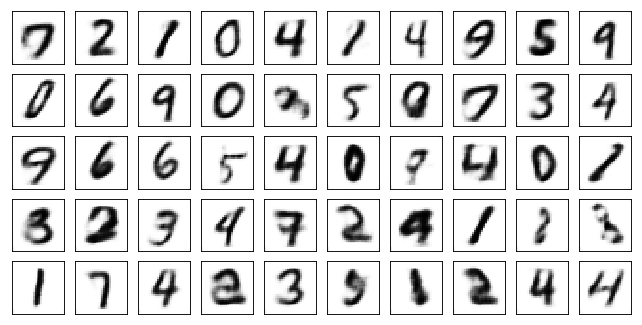

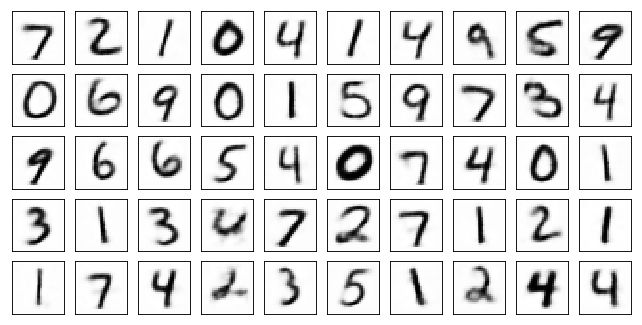

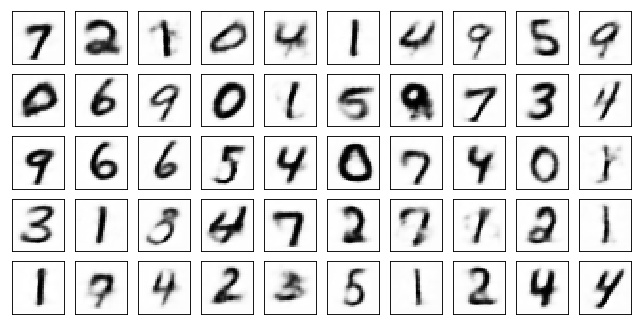

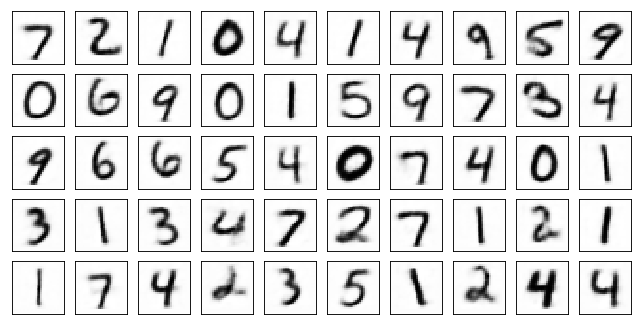

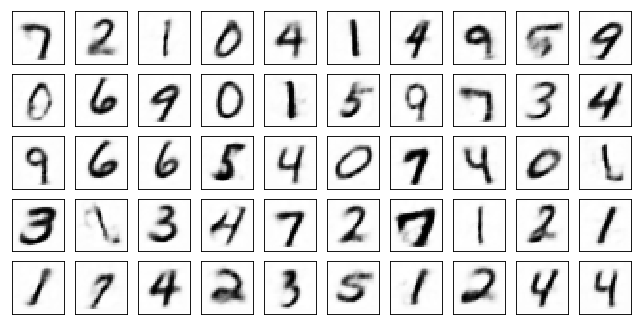

Test losses: VAE10: 0.0732/8.9748 VAE10+bn: 0.0725/8.5148 VAE10+bn+dp: 0.0752/8.1397
Train Epoch: 38 [0/50000 (0%)]	Losses VAE10: 0.1000 VAE10+bn: 0.0966 VAE10+bn+dp: 0.0984
Train Epoch: 38 [10000/50000 (20%)]	Losses VAE10: 0.0940 VAE10+bn: 0.0929 VAE10+bn+dp: 0.0937
Train Epoch: 38 [20000/50000 (40%)]	Losses VAE10: 0.0955 VAE10+bn: 0.0971 VAE10+bn+dp: 0.0949
Train Epoch: 38 [30000/50000 (60%)]	Losses VAE10: 0.0939 VAE10+bn: 0.0930 VAE10+bn+dp: 0.0943
Train Epoch: 38 [40000/50000 (80%)]	Losses VAE10: 0.0974 VAE10+bn: 0.1075 VAE10+bn+dp: 0.1060
Train Epoch: 38 [50000/50000 (100%)]	Losses VAE10: 0.0887 VAE10+bn: 0.0872 VAE10+bn+dp: 0.0910


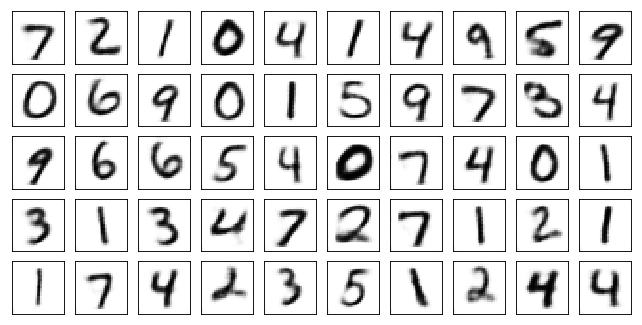

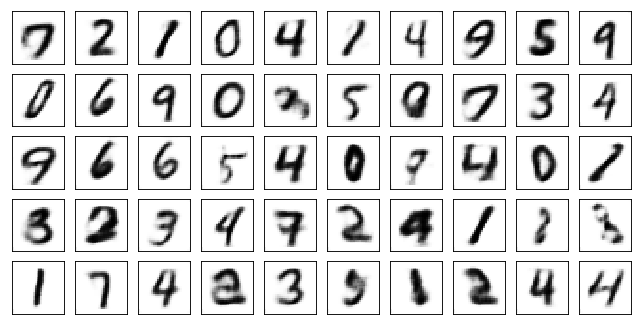

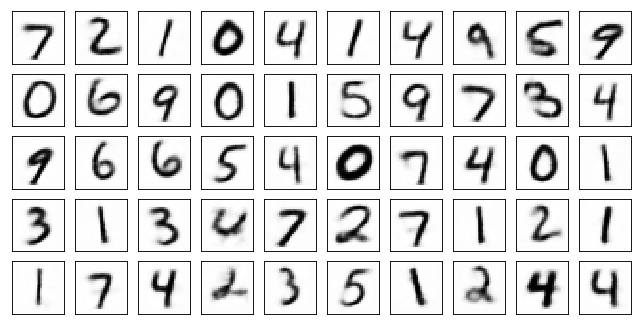

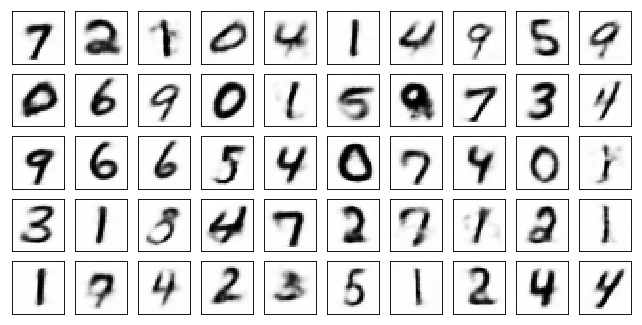

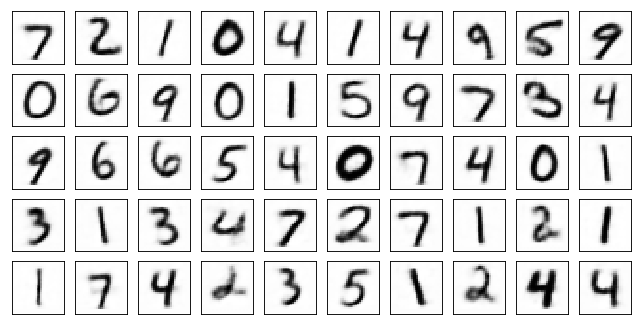

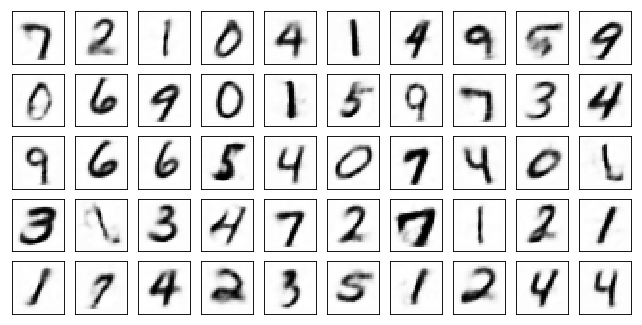

Test losses: VAE10: 0.0730/8.9198 VAE10+bn: 0.0718/8.5435 VAE10+bn+dp: 0.0744/8.0436
Train Epoch: 39 [0/50000 (0%)]	Losses VAE10: 0.0976 VAE10+bn: 0.0930 VAE10+bn+dp: 0.1037
Train Epoch: 39 [10000/50000 (20%)]	Losses VAE10: 0.0922 VAE10+bn: 0.0893 VAE10+bn+dp: 0.0920
Train Epoch: 39 [20000/50000 (40%)]	Losses VAE10: 0.1064 VAE10+bn: 0.0978 VAE10+bn+dp: 0.1063
Train Epoch: 39 [30000/50000 (60%)]	Losses VAE10: 0.0806 VAE10+bn: 0.0748 VAE10+bn+dp: 0.0736
Train Epoch: 39 [40000/50000 (80%)]	Losses VAE10: 0.0972 VAE10+bn: 0.0963 VAE10+bn+dp: 0.0987
Train Epoch: 39 [50000/50000 (100%)]	Losses VAE10: 0.0965 VAE10+bn: 0.1010 VAE10+bn+dp: 0.0993


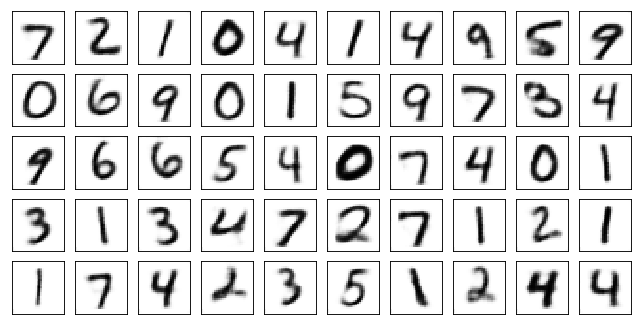

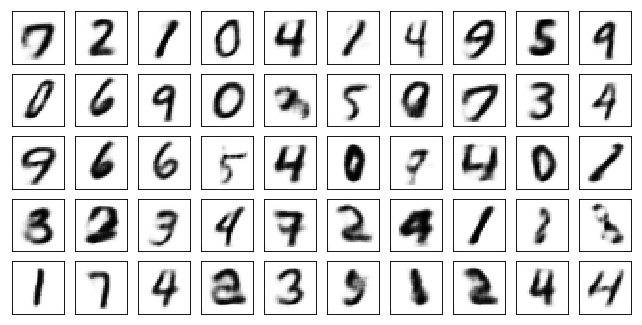

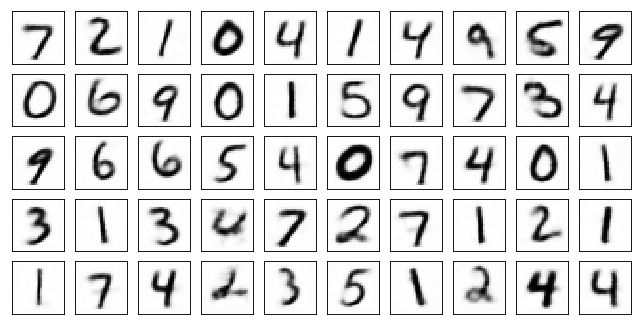

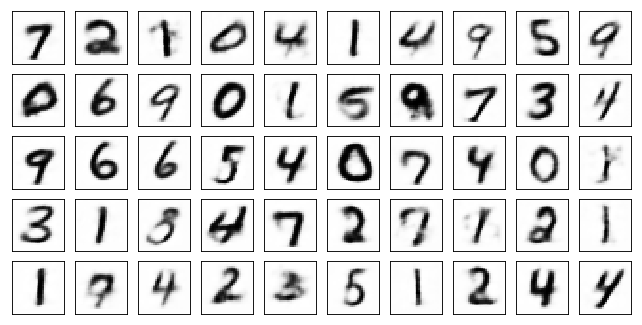

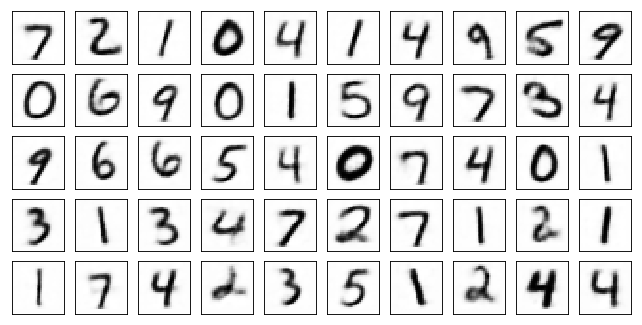

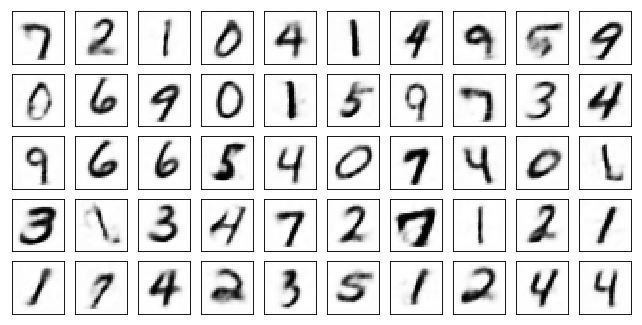

Test losses: VAE10: 0.0729/8.9434 VAE10+bn: 0.0718/8.5513 VAE10+bn+dp: 0.0747/8.0578
Train Epoch: 40 [0/50000 (0%)]	Losses VAE10: 0.0855 VAE10+bn: 0.0846 VAE10+bn+dp: 0.0817
Train Epoch: 40 [10000/50000 (20%)]	Losses VAE10: 0.0861 VAE10+bn: 0.0859 VAE10+bn+dp: 0.0886
Train Epoch: 40 [20000/50000 (40%)]	Losses VAE10: 0.0895 VAE10+bn: 0.0909 VAE10+bn+dp: 0.0929
Train Epoch: 40 [30000/50000 (60%)]	Losses VAE10: 0.0883 VAE10+bn: 0.0846 VAE10+bn+dp: 0.0883
Train Epoch: 40 [40000/50000 (80%)]	Losses VAE10: 0.0852 VAE10+bn: 0.0857 VAE10+bn+dp: 0.0894
Train Epoch: 40 [50000/50000 (100%)]	Losses VAE10: 0.0936 VAE10+bn: 0.0868 VAE10+bn+dp: 0.0894


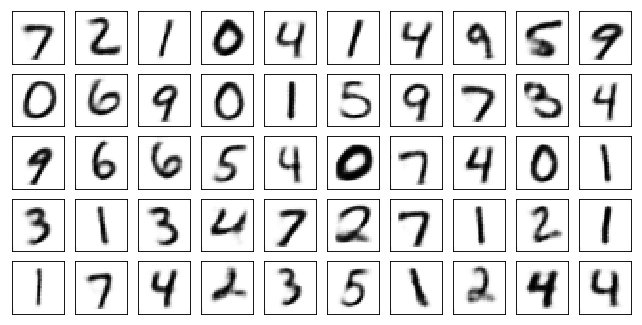

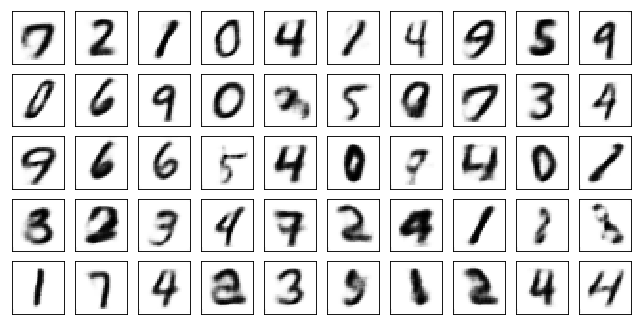

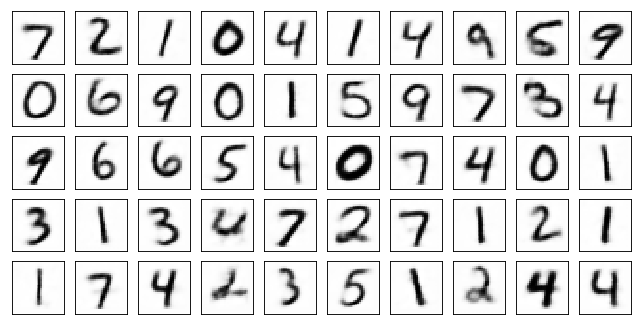

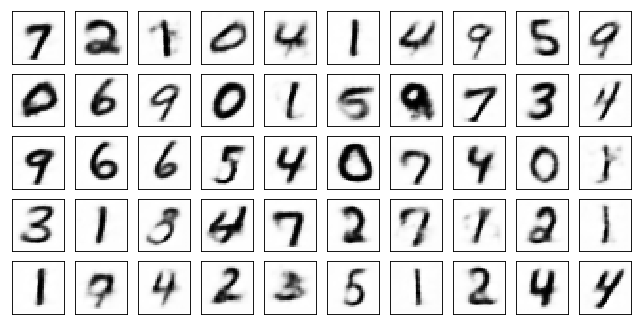

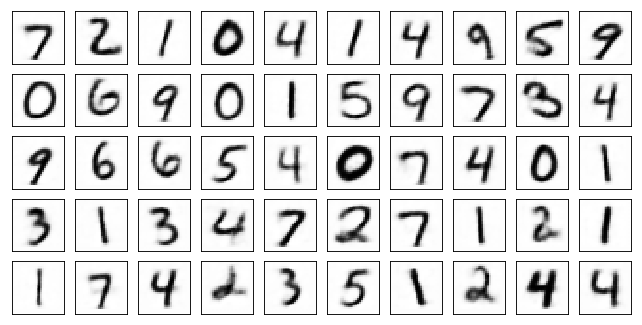

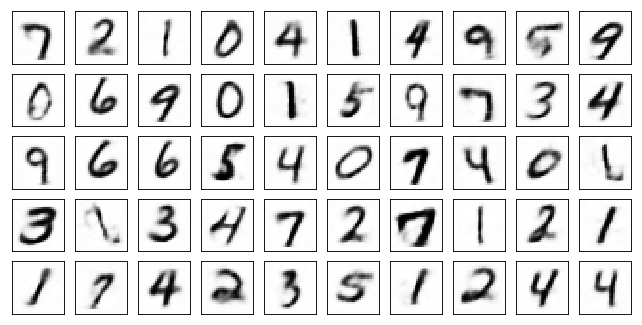

Test losses: VAE10: 0.0731/8.7639 VAE10+bn: 0.0716/8.4719 VAE10+bn+dp: 0.0746/8.1206


In [14]:
for epoch in range(1, 41):
    for model in models.values():
        model.train()
    train(epoch, models, train_log)
    for model in models.values():
        model.eval()
    test(models, valid_loader, epoch, test_log)

In [18]:
torch.save(models['VAE10'], './vae_log_oh_10')
torch.save(models['VAE10+bn'], './vae_log_oh_bn_10')
torch.save(models['VAE10+bn+dp'], './vae_log_oh_bn_dp_10')

/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type ConvLayer. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type FullyConnected. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/Programs/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't r

### Вывод результатов

In [19]:
model = torch.load('./vae_log_oh_bn_10')

In [20]:
def show_generated_samples(cl):
    pred_z = torch.randn((50, 10))
    pred_cl = torch.ones(50, dtype=torch.long) * cl
    pred_oh = one_hot(y=pred_cl, batch_size=50)
    pred_h = torch.cat((pred_z, pred_oh), 1) 

    pred_gen = model.decode(pred_h).data.numpy()
    plot_mnist(pred_gen, (5, 10))

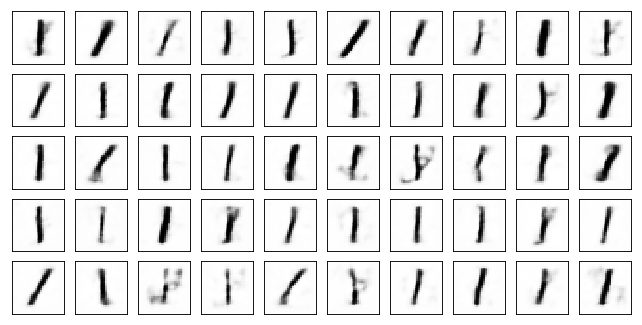

In [21]:
show_generated_samples(1)

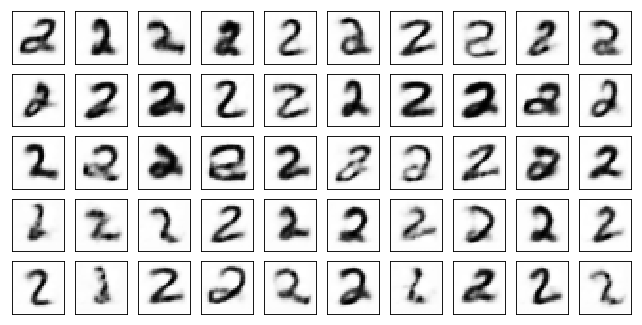

In [22]:
show_generated_samples(2)

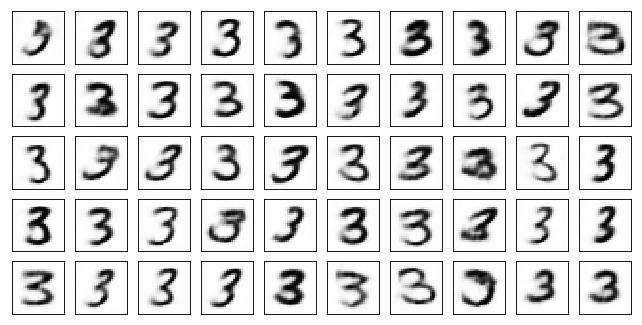

In [23]:
show_generated_samples(3)

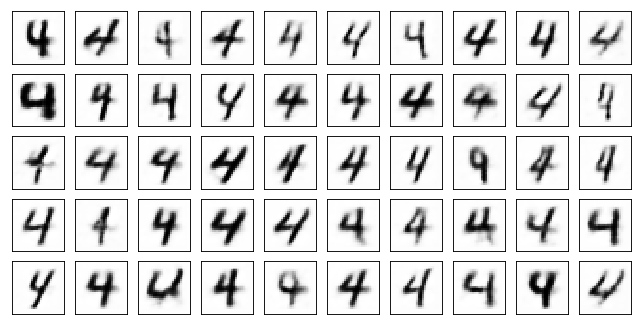

In [24]:
show_generated_samples(4)

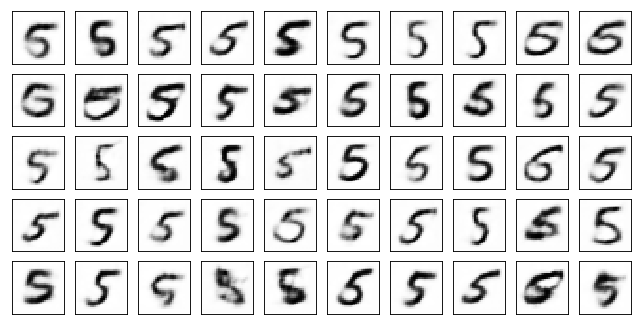

In [25]:
show_generated_samples(5)